In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import warnings
import plotly.express as px
plt.style.use("ggplot")
from scipy.stats import boxcox
from scipy.stats import spearmanr as sr,chi2_contingency
def getPlotLabels(df,column,splot):
    for p in splot.patches:
        splot.annotate(format(p.get_height(), '.0f'), 
                       (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', 
                       size=15,
                       xytext = (0, -12), 
                       textcoords = 'offset points',
                       fontsize="20",
                       fontweight="bold",
                       color="#e9e9e6")
warnings.filterwarnings('ignore')
df=pd.read_csv("../data/adult.csv")
df

,age,workclass,final-weight,education,educational-num-of-years,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


Lets Look at the description to understand it better.

In [2]:
df.describe()

,age,final-weight,educational-num-of-years,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


Looking at the Capital gain and Loss we see that there might be outliers due to major difference in min and max values.

Lets Check the info and let us know how many numerical and categorical columns are there.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   age                       48842 non-null  int64 
 1   workclass                 48842 non-null  object
 2   final-weight              48842 non-null  int64 
 3   education                 48842 non-null  object
 4   educational-num-of-years  48842 non-null  int64 
 5   marital-status            48842 non-null  object
 6   occupation                48842 non-null  object
 7   relationship              48842 non-null  object
 8   race                      48842 non-null  object
 9   gender                    48842 non-null  object
 10  capital-gain              48842 non-null  int64 
 11  capital-loss              48842 non-null  int64 
 12  hours-per-week            48842 non-null  int64 
 13  native-country            48842 non-null  object
 14  income                

Looking aboove we see that there are no null values in the dataset and some are numerical columns while some are categorical but still lets check if there are any garbage values or not and if the columns also fit the correct category.i.e are category types really category and not numeric and vice versa. Lets Start by analysing categorical values.

In [4]:
categ=df.select_dtypes("object")
categ

,workclass,education,marital-status,occupation,relationship,race,gender,native-country,income
0,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States,<=50K
1,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States,<=50K
2,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States,>50K
3,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States,>50K
4,?,Some-college,Never-married,?,Own-child,White,Female,United-States,<=50K
...,...,...,...,...,...,...,...,...,...
48837,Private,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,United-States,<=50K
48838,Private,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,United-States,>50K
48839,Private,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,United-States,<=50K
48840,Private,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,United-States,<=50K


So in all there are 9 categorical columns

Aboove we observe that "?" seems to be inappropriate value or garbage value.So lets try to impute it.

In [5]:
garbageCol=[i for i in categ.columns if categ[categ[i]=="?"].shape[0]!=0]
garbageCol

['workclass', 'occupation', 'native-country']

so aboove are the columns which have "?" as garbage values.

In [6]:
df[df["workclass"]=="?"][["education","marital-status","relationship","race","gender","native-country"]].mode()

,education,marital-status,relationship,race,gender,native-country
0,Some-college,Never-married,Own-child,White,Male,United-States


Replacing "?" with mode of workclass with aboove values as filter in workclass column

In [7]:
colname="workclass"
pd.DataFrame([df[df["education"]=="Some-college"][colname].mode()[0],
df[df["marital-status"]=="Never-married"][colname].mode()[0],
df[df["relationship"]=="Own-child"][colname].mode()[0],
df[df["race"]=="White"][colname].mode()[0],
df[df["gender"]=="Male"][colname].mode()[0],
df[df["native-country"]=="United-States"][colname].mode()[0]]).mode()

,0
0,Private


In [8]:
df["workclass"].replace("?","Private",inplace=True)

Replacing Occupation

In [9]:
df[df["occupation"]=="?"][["education","marital-status","relationship","race","gender","native-country","workclass"]].mode()

,education,marital-status,relationship,race,gender,native-country,workclass
0,Some-college,Never-married,Own-child,White,Male,United-States,Private


In [10]:
colname="occupation"
pd.DataFrame([df[df["education"]=="Some-college"][colname].mode()[0],
df[df["marital-status"]=="Never-married"][colname].mode()[0],
df[df["relationship"]=="Own-child"][colname].mode()[0],
df[df["race"]=="White"][colname].mode()[0],
df[df["gender"]=="Male"][colname].mode()[0],
df[df["native-country"]=="United-States"][colname].mode()[0],
df[df["workclass"]=="Private"][colname].mode()[0]]).mode()

,0
0,Craft-repair


In [11]:
df["occupation"].replace("?","Craft-repair",inplace=True)

In [12]:
df["occupation"].value_counts()

Craft-repair         8921
Prof-specialty       6172
Exec-managerial      6086
Adm-clerical         5611
Sales                5504
Other-service        4923
Machine-op-inspct    3022
Transport-moving     2355
Handlers-cleaners    2072
Farming-fishing      1490
Tech-support         1446
Protective-serv       983
Priv-house-serv       242
Armed-Forces           15
Name: occupation, dtype: int64

In [13]:
df[df["native-country"]=="?"][["education","marital-status","relationship","race","gender","workclass","occupation"]].mode()

,education,marital-status,relationship,race,gender,workclass,occupation
0,Bachelors,Married-civ-spouse,Husband,White,Male,Private,Prof-specialty


In [14]:
colname="native-country"
pd.DataFrame([df[df["education"]=="Bachelors"][colname].mode()[0],
df[df["marital-status"]=="Married-civ-spouse"][colname].mode()[0],
df[df["relationship"]=="Husband"][colname].mode()[0],
df[df["race"]=="White"][colname].mode()[0],
df[df["gender"]=="Male"][colname].mode()[0],
df[df["occupation"]=="Prof-specialty"][colname].mode()[0],
df[df["workclass"]=="Private"][colname].mode()[0]]).mode()

,0
0,United-States


In [15]:
df["native-country"].replace("?","United-States",inplace=True)

Lets Analyse Categorical columns now

Lets See First The Count Of Genders and income In our dataset

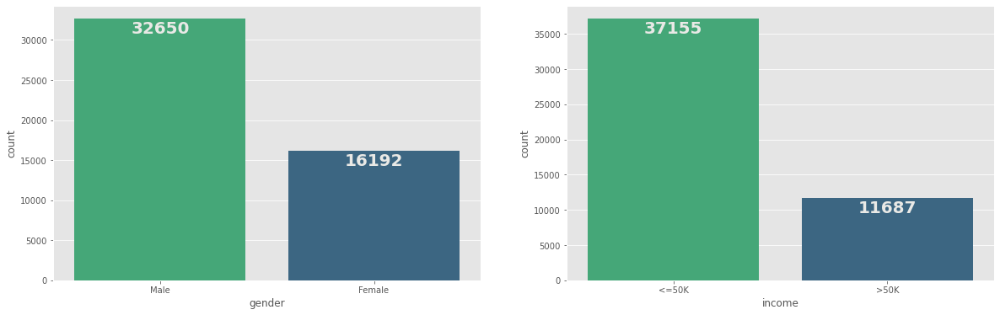

In [16]:
plt.figure(figsize=(20,6))
plt.subplot(121)
ax=sns.countplot(x="gender",data=df,palette="viridis_r")
getPlotLabels(df,"gender",ax)
plt.subplot(122)
ax=sns.countplot(x="income",data=df,palette="viridis_r")
getPlotLabels(df,"income",ax)

From Aboove we observe and see that Males have Higher frequency compared To Females and Most of the males and females have Income <50K.

<AxesSubplot:xlabel='gender,income'>

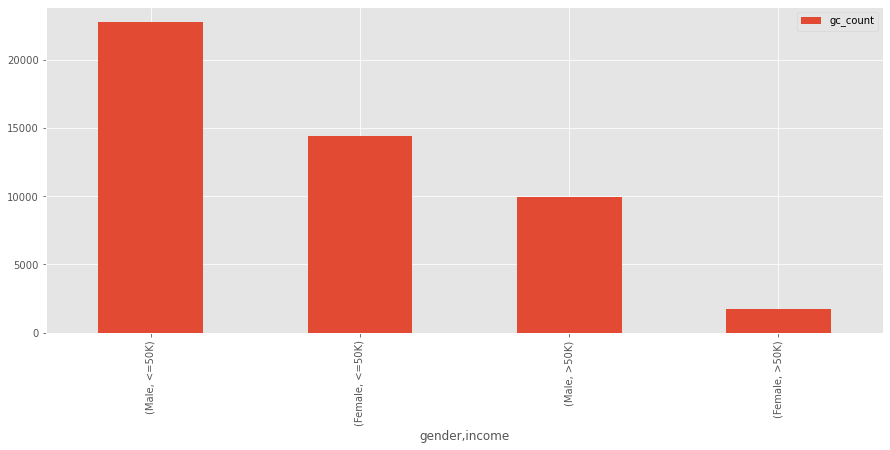

In [17]:
dfw=df.groupby(["gender","income"])[["gender"]].count()
dfw.rename(columns={"gender":"gc_count"},inplace=True)
dfw.sort_values("gc_count",inplace=True,ascending=False)
dfw.plot(kind="bar",figsize=(15,6))

Lets Now see workclass wrt to gender and income

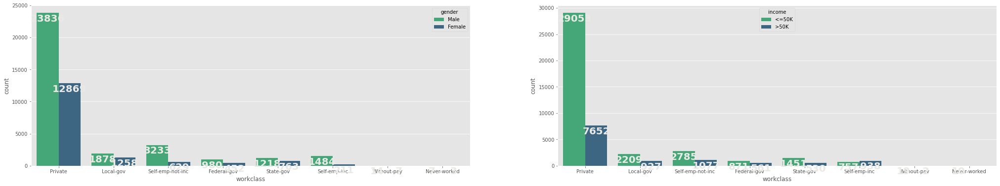

In [18]:
plt.figure(figsize=(35,6))
plt.subplot(121)
ax=sns.countplot(x="workclass",hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,"workclass",ax)
plt.subplot(122)
ax=sns.countplot(x="workclass",data=df,palette="viridis_r",hue="income")
getPlotLabels(df,"workclass",ax)

From aboove we observe that Private Workclass has More Frequency and that of Males with income less <50K. Proved Below

<AxesSubplot:xlabel='gender,income,workclass'>

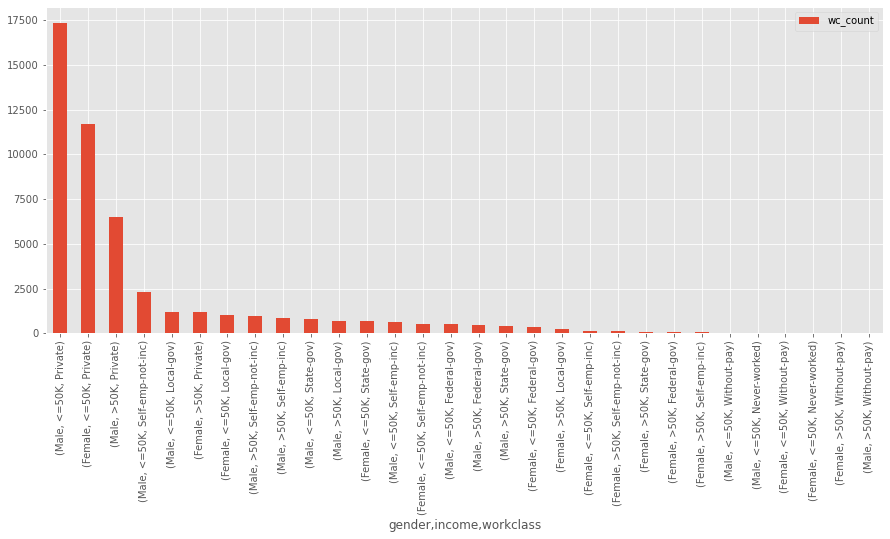

In [19]:
dfw=df.groupby(["gender","income","workclass"])[["workclass"]].count()
dfw.rename(columns={"workclass":"wc_count"},inplace=True)
dfw.sort_values("wc_count",inplace=True,ascending=False)
dfw.plot(kind="bar",figsize=(15,6))

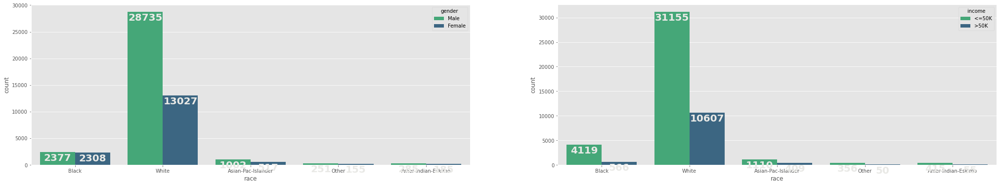

In [20]:
c="race"
plt.figure(figsize=(35,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

From aboove we see that males in White race have more frequency and also they have income <50K and as we saw aboove most males belong to private class.So we assume that White Males In Private Class have More frequency of income being <50K

<AxesSubplot:xlabel='gender,income,workclass,race'>

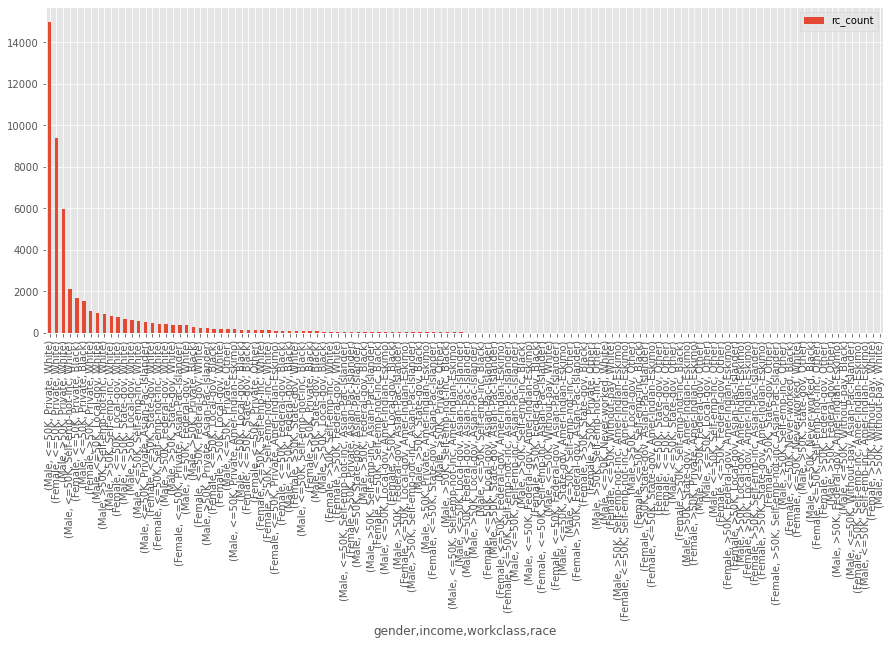

In [21]:
dfw=df.groupby(["gender","income","workclass","race"])[["race"]].count()
dfw.rename(columns={"race":"rc_count"},inplace=True)
dfw.sort_values("rc_count",inplace=True,ascending=False)
dfw.plot(kind="bar",figsize=(15,6))

Lets Now Look at Education wrt to gender and Income.

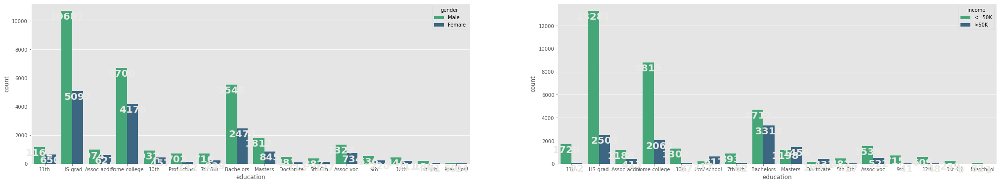

In [22]:
c="education"
plt.figure(figsize=(35,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

We observe that Majority of Males are there and have income <50K and we assume that they are from white race and belong to private workspace and are HS grads

<AxesSubplot:xlabel='gender,income,workclass,race,education'>

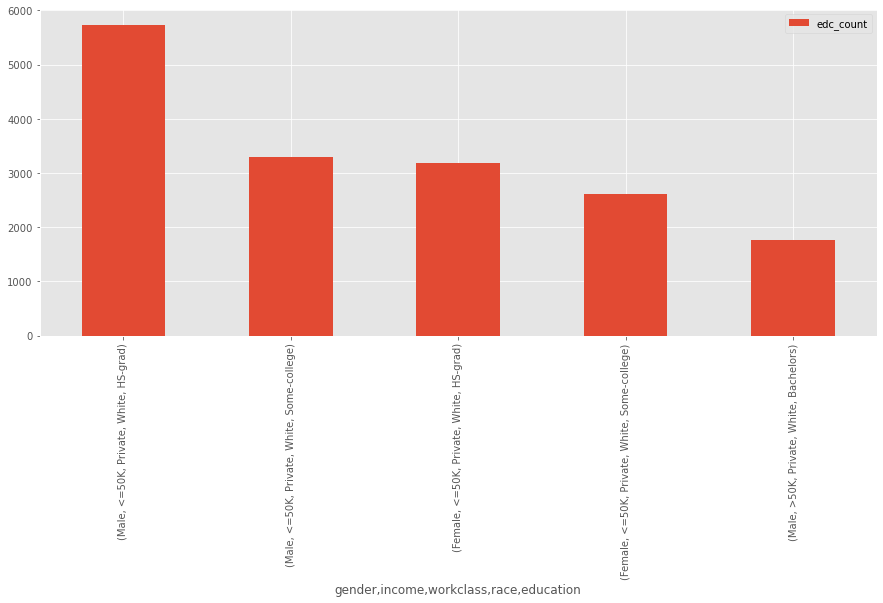

In [23]:
dfw=df.groupby(["gender","income","workclass","race","education"])[["education"]].count()
dfw.rename(columns={"education":"edc_count"},inplace=True)
dfw.sort_values("edc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

Now lets look at Marital status wrt to gender and income

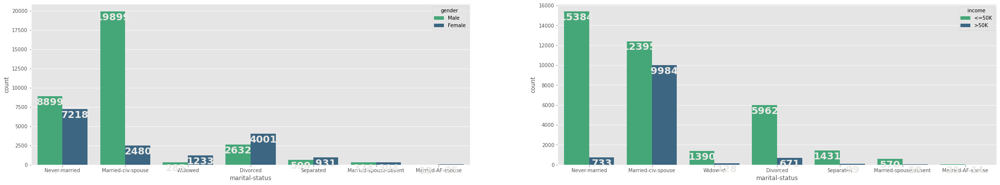

In [24]:
c="marital-status"
plt.figure(figsize=(35,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

From aboove we observer that Males who never married have high frequency of income <50K but wrt to gender we see Males who have civ spouse have higher counts. So we assume that Males who never married having <50K income from private workspace and race as white with eu as HS grad are Highest.

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status'>

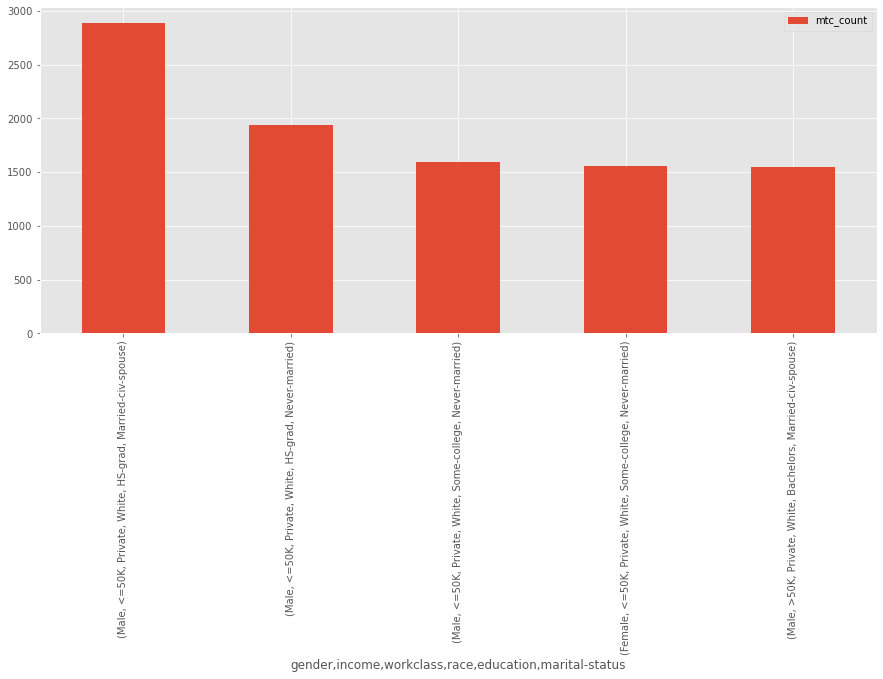

In [25]:
dfw=df.groupby(["gender","income","workclass","race","education","marital-status"])[["marital-status"]].count()
dfw.rename(columns={"marital-status":"mtc_count"},inplace=True)
dfw.sort_values("mtc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

Well our assumption of being that unmarried males being at top is not true but that married males having civil spouse is highest havinh HS grad as education working in private secctor belonging to white race having income <50 K. But we aint wrong,we can say that unmarried people are top but they are second top. So We infer that Males having income <50K work in Privare having eductaion as HS grad an belong to white Race.

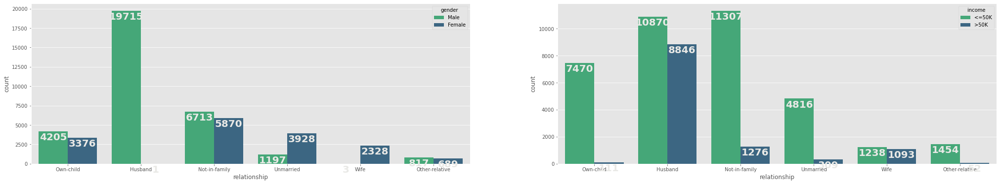

In [26]:
c="relationship"
plt.figure(figsize=(35,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

From aboove we observe that Males who dont have a family have high frequency of income<50K but Gender wise Husbands have high frequency.
We saw that the high ratio goes wrt to gender i.e The Highest count was wrt to Married civ spuse and not wrt to unmarried being income hight to it. So now keeping that in mind we assume that Since most of them are Males and are married civil spouse, Obviosuly they will be husbands and state That
Husbands who are civil spouse having HS grad education belonging to white race working in private sector have highest count.

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship'>

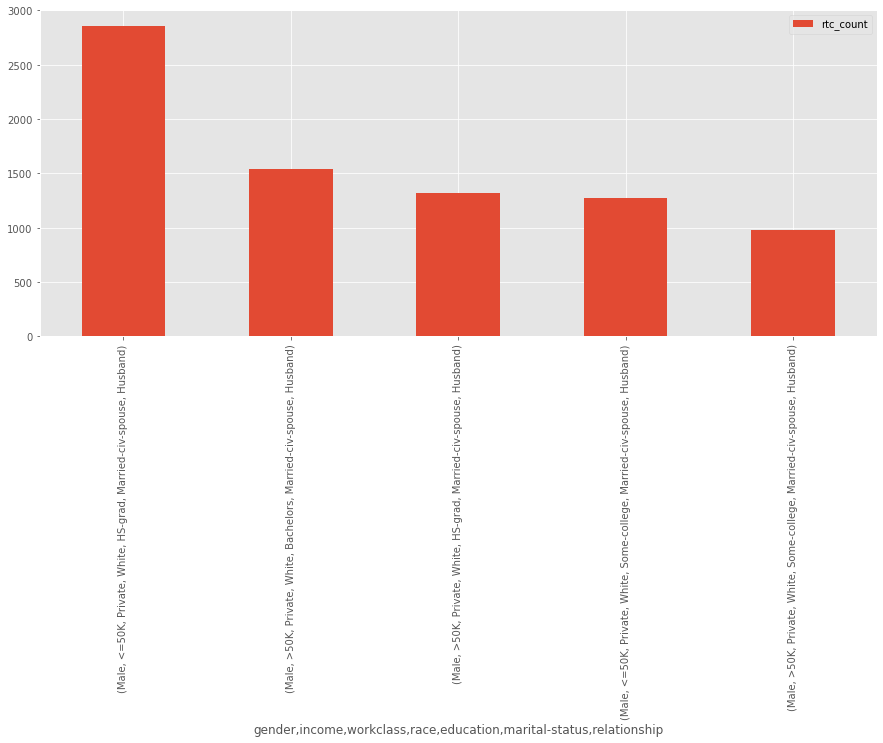

In [27]:
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship"])[["relationship"]].count()
dfw.rename(columns={"relationship":"rtc_count"},inplace=True)
dfw.sort_values("rtc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

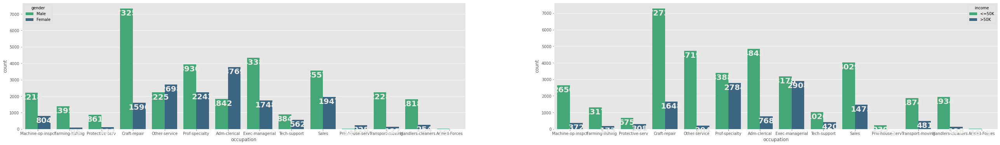

In [28]:
c="occupation"
plt.figure(figsize=(45,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

From aboove we Observe that Males have higher Frequency with income <50K and Have occupation In the Field of Crafts and repair.So now we assume that Males who work in Private Class having HS grad as education and are married civil spouse belonging to white race have profession as crafts.

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship,occupation'>

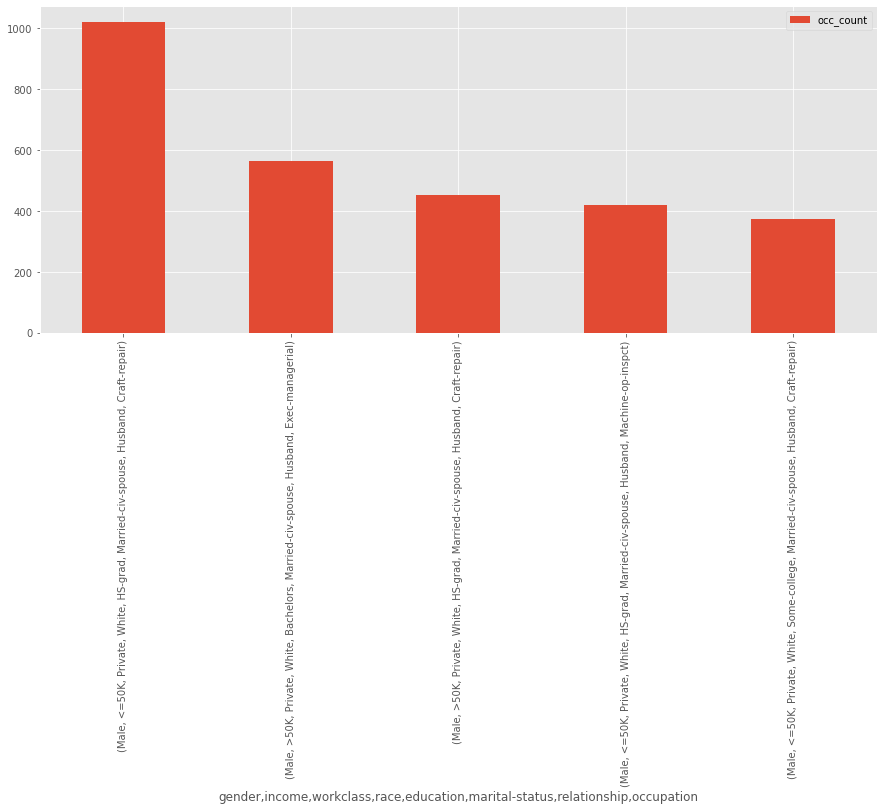

In [29]:
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation"])[["occupation"]].count()
dfw.rename(columns={"occupation":"occ_count"},inplace=True)
dfw.sort_values("occ_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

Now Lets See Which country they belong wrt to Gender and Income.

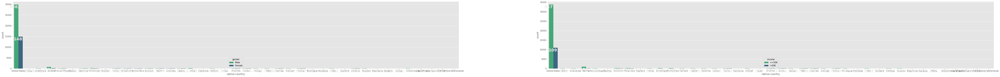

In [30]:
c="native-country"
plt.figure(figsize=(85,6))
plt.subplot(121)
ax=sns.countplot(x=c,hue="gender",data=df,palette="viridis_r")
getPlotLabels(df,c,ax)
plt.subplot(122)
ax=sns.countplot(x=c,data=df,palette="viridis_r",hue="income")
getPlotLabels(df,c,ax)

From aboove we see Most of males having Income <50K are from USA and Most of them are Males. So Now we assume That These are from USA so belong to white race working in private class as Crafts repair and are civil spouses with education as HS grad

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship,occupation,native-country'>

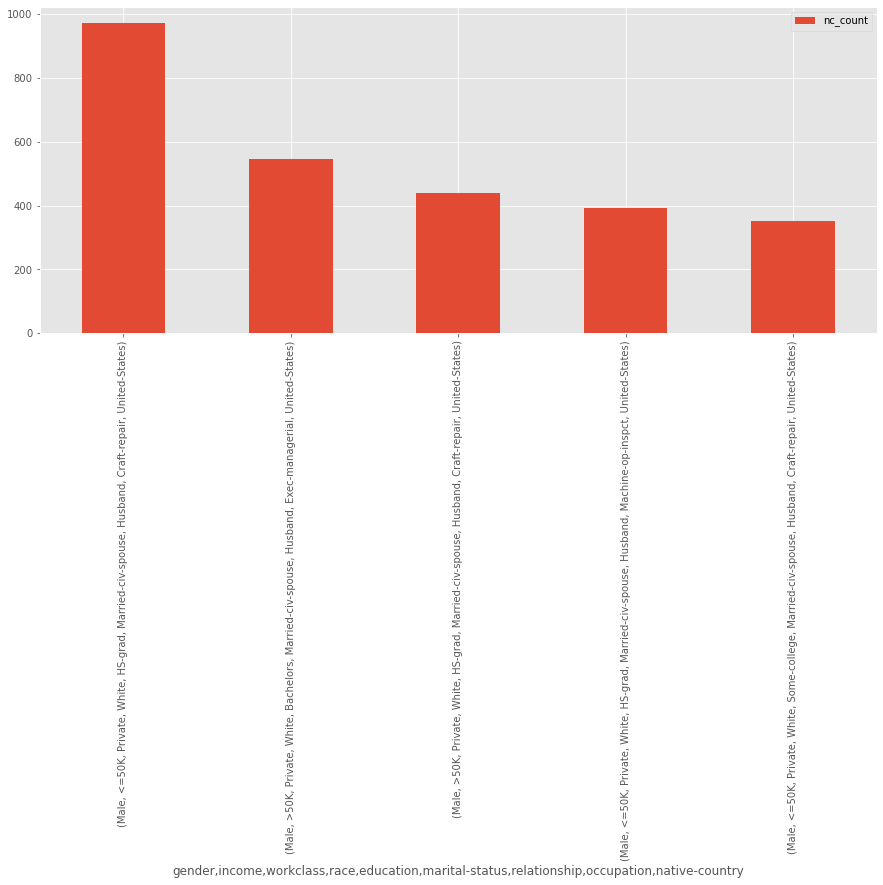

In [31]:
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

([<matplotlib.patches.Wedge at 0x25b045db370>,
 [Text(0.4681260580534064, 0.9954185018229162, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(-1.0674453609185204, 0.2656320791123123, 'Male_>50K_Private_White_Bachelors_Married-civ-spouse_Husband_Exec-managerial_United-States'),
  Text(-0.6826951390967885, -0.8625122300892994, 'Male_>50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(0.3204207725263261, -1.0522977375883846, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Machine-op-inspct_United-States'),
  Text(1.0088438472038888, -0.43844508431371065, 'Male_<=50K_Private_White_Some-college_Married-civ-spouse_Husband_Craft-repair_United-States')],
 [Text(0.25534148621094893, 0.5429555464488633, '36.01%'),
  Text(-0.5822429241373747, 0.14489022497035214, '20.22%'),
  Text(-0.37237916678006644, -0.4704612164123451, '16.23%'),
  Text(0.17477496683254148, -0.5739805841391188, '14.49%'),
  T

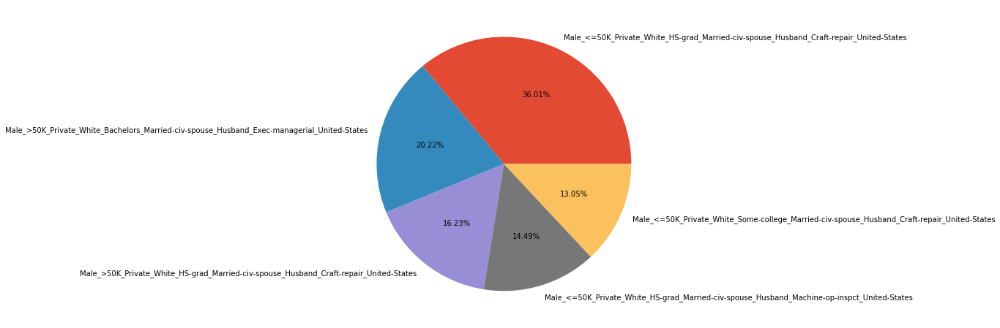

In [32]:
plt.figure(figsize=(10,8))
dfw=dfw.reset_index()
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

<b>
SO WITH OUR CATEGORICAL ANALYSIS WE STATE THAT <BR>MOST OF THE ADULTS ARE <font color="green">MARRIED MALES</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">PRIVATE WORKCLASS</font> COMING FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font>
    AND BELONG TO <font color="red">36%</font> OF THE POPULATION</b> 

SO WE DID OUR CATEGORICAL ANALYSIS AND COUNTED THE GENDER,WHO HAS INCOME BELOW OR ABOOVE 50K,AND SO ON AND WE SAW THE STATS OF COUNTS FROM DIFFERENT FEATURES.
NOW LETS CARRY OUT THE NUMERICAL VS CATEGORICAL STATS AND CHECK THEIR NUMERICAL CHARACTERISTICS AND STATS.

- Lets Combine Gender and Income as 
    - Males > 50 K
    - males <=50K
    - Females >50K
    - females <=50K
- This will Make Our Numerical Analysis More precise to analyse and See.. Remember this is numerical analysis not categorical. Just that we have merged the gender and income so we have one filter as hue and One graph and it become easy to distinguish and This Column wont be contributiong to Our ML model traing and will be deleted once we are done using this colum as hue and filter.

In [33]:
df["Numeric_analyser"]="BLANK"
df.loc[(df["gender"]=="Male") & (df["income"]=="<=50K"),"Numeric_analyser"]="Male_<=50K"
df.loc[(df["gender"]=="Male") & (df["income"]==">50K"),"Numeric_analyser"]="Male_>50K"
df.loc[(df["gender"]=="Female") & (df["income"]=="<=50K"),"Numeric_analyser"]="Female_<=50K"
df.loc[(df["gender"]=="Female") & (df["income"]==">50K"),"Numeric_analyser"]="Female_>50K"

Lets Now Check with histogram what is the frequency of different age ranges

In [34]:
plt.figure(figsize=(20,6))
# sns.histplot(x="age",data=df,hue="Numeric_analyser",palette="viridis_r")
px.histogram(df,x="age",color="Numeric_analyser")

<Figure size 1440x432 with 0 Axes>

- From aboove we see that Most of the
    - Males lie in the age range of 28 to 45 
    - Females lie in age range of around 18 to 28
    - males with Income < 50K lie more between 20 and 30.
    - Females with Income >50K lie between 30 and 50.
- So we can assume That males who belong to white race working in private sector having HS grad as education married as civil spouse have age range between 28 to 45.

Lets Check the age wrt to Gender and Income.But First Lets Check if Age range again with box plot also which will give us precise idea.

In [35]:
plt.figure(figsize=(20,6))
px.box(df,x="age",color="Numeric_analyser")

<Figure size 1440x432 with 0 Axes>

- From the aboove Box plot,We See That Bt q1-q3 range
    - Males with income <50K lie in age range of 26-46
    - Males with income >50K lie in range of 37-51
    - Females with income <50K lie in age range 24-46
    - Females with income >50K lie in age range 35-49
- By Rule 18 is the starting age of being adult,Lower than that is not considered as an adult but lets check the people in age range of 18 first and then lets have a overall idea of age via median.

In [36]:
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["age"]].mean()
dfw.rename(columns={"age":"age_count"},inplace=True)
dfw.sort_values("age_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw[(dfw["gender"]=="Male") & (dfw["income"]=="<=50K") & (dfw["workclass"]=="Private") & (dfw["race"]=="White") & (dfw["education"]=="HS-grad") & (dfw["marital-status"]=="Married-civ-spouse") & (dfw["relationship"]=="Husband") & (dfw["occupation"]=="Craft-repair") & (dfw["native-country"]=="United-States")]

,gender,income,workclass,race,education,marital-status,relationship,occupation,native-country,age_count
4684,Male,<=50K,Private,White,HS-grad,Married-civ-spouse,Husband,Craft-repair,United-States,42.688912


So we observe that our guess and assumption was correct and the avg age is 42 and between 28 and 48.

<b>
SO WITH OUR CATEGORICAL ANALYSIS WE STATE THAT <BR>MOST OF THE ADULTS ARE <font color="green">MARRIED MALES</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">PRIVATE WORKCLASS</font> COMING FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font>AND BELONG TO <font color="red">36%</font> OF THE POPULATION AND ARE AROUND <font color="green">42 YRS OLD AND FALL WITHIN YOUNG AND STRONG ADULTS CATEGORY(I.E BETWEEN 28 TO 48)</font>
</b>

Lets Analyse For Age below 18

<AxesSubplot:ylabel='None'>

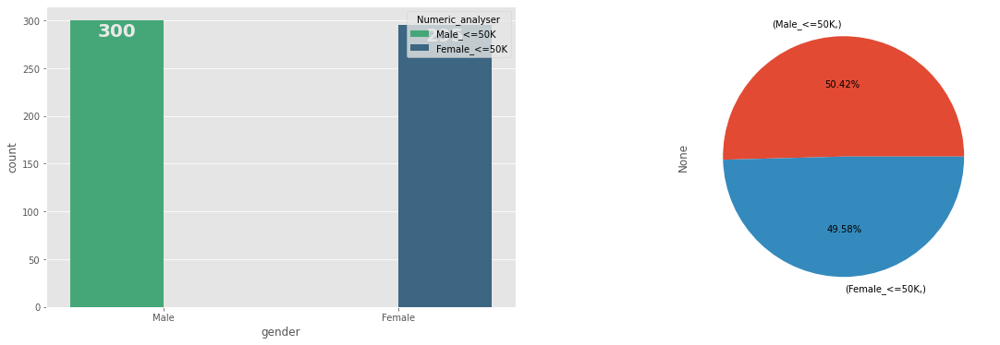

In [37]:
plt.figure(figsize=(20,6))
plt.subplot(121)
ax=sns.countplot(x="gender",data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,"gender",ax)
plt.subplot(122)
df[df["age"]<18][["Numeric_analyser"]].value_counts().plot(kind="pie",autopct="%.2f%%")

- From aboove we observe that Both Males and Females are nearly equal in Percentage around 50 with 300 Males and 295 females below 18 and have income less than <50K and That explains that since they are below 18,they are sure to have income below 50K.
- although the income is below <50K,It may be that these people maybe getting 
    - pocket Money
    - Working a Light Part time Job
    - Might have thier own bussiness operating(Maybe not a large scale as none of the kids earn more than 50K)
    - So on

- But We cannot assume surely and canot even state it.This is just a guess of what todays kids might do as people do earn money below 18 and since USA is max frquency country anything can happen and can have countless reasons behind it and we dont know for sure

Lets Check the Workclass first to see whether or not people below 18 work or not?

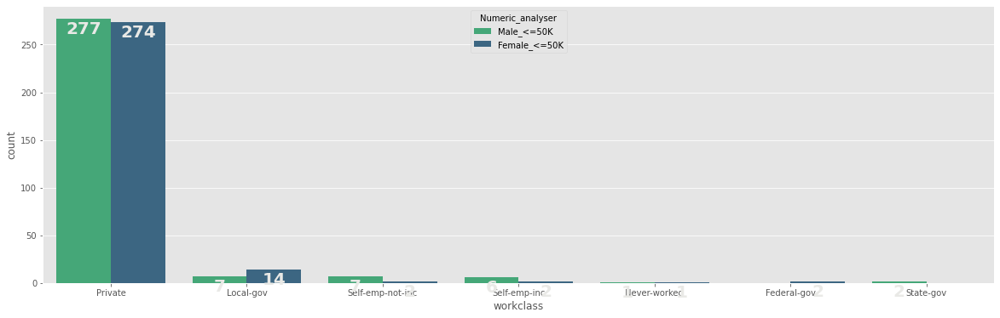

In [38]:
plt.figure(figsize=(20,6))
c="workclass"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- So aboove we assumed that people below 18 might not be working seems to be False and Looking in the graph aboove we observer that people below 18 mostly males have a private workclass or might be working with private agencies and as thier income is <50K its good to assume that they might be freshers working part time to earn and also to add, their wages are low.
- So we assume that Males and females are Somewhat Near in Frequency Belonging to private class

<AxesSubplot:xlabel='Numeric_analyser,workclass'>

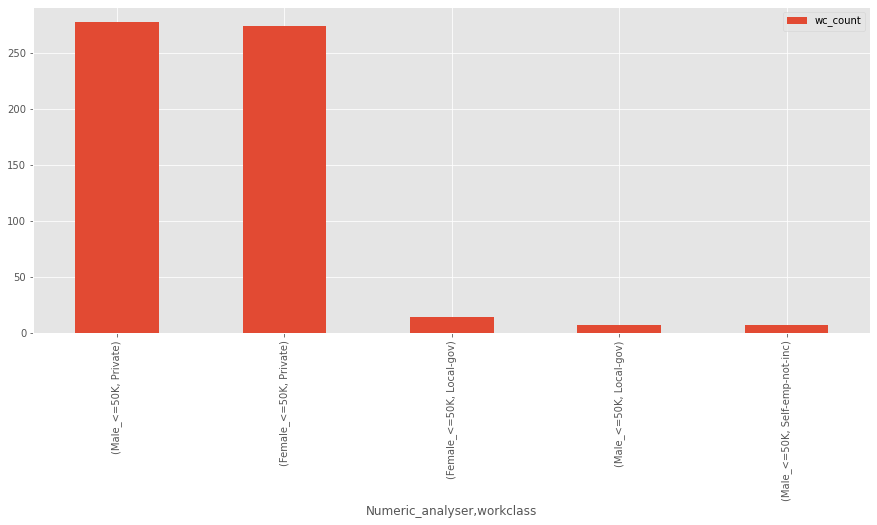

In [39]:
dfw=df[df["age"]<18].groupby(["Numeric_analyser","workclass"])[["workclass"]].count()
dfw.rename(columns={"workclass":"wc_count"},inplace=True)
dfw.sort_values("wc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

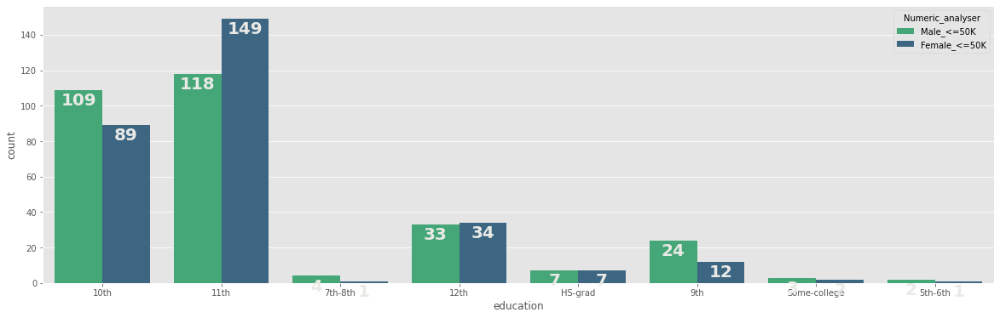

In [40]:
plt.figure(figsize=(20,6))
c="education"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- From aboove we observe that Most of the People have completedd thier education till 11th std and Females have high frequency here.
- To Look Over males,They have completed their education till 9th and 10th Std with 10th std Males having higher frequency.
- Since Females are More we assume that Females from Private workclass are more

<AxesSubplot:xlabel='gender,income,workclass,education'>

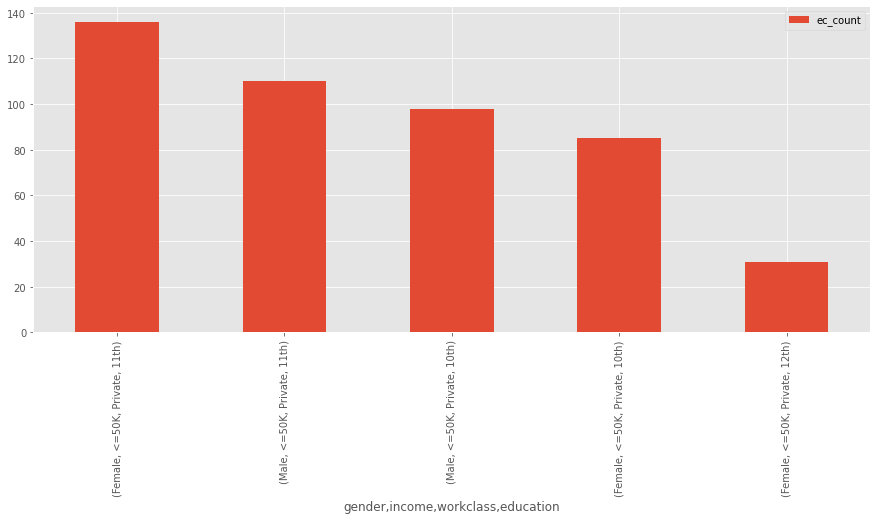

In [41]:
dfw=df[df["age"]<18].groupby(["gender","income","workclass","education"])[["education"]].count()
dfw.rename(columns={"education":"ec_count"},inplace=True)
dfw.sort_values("ec_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

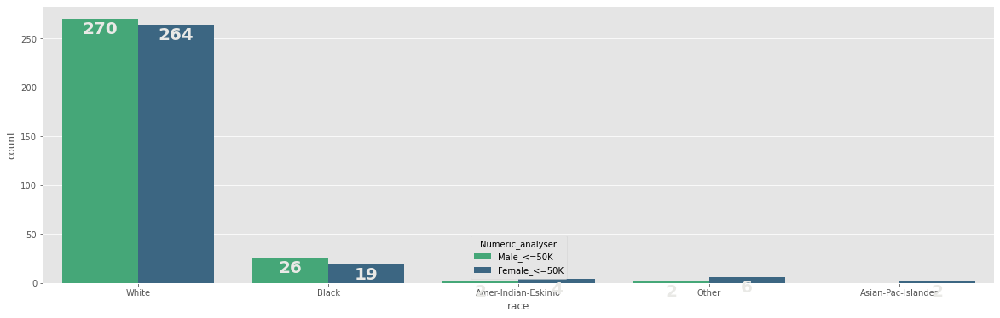

In [42]:
plt.figure(figsize=(20,6))
c="race"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- There are almost equal number of Males and females belonging to white Race.
- We assume that Males or Females with private and education as 11th std will be high in frequency,to be precise Males might be higher and females will be equal

<AxesSubplot:xlabel='Numeric_analyser,workclass,education,race'>

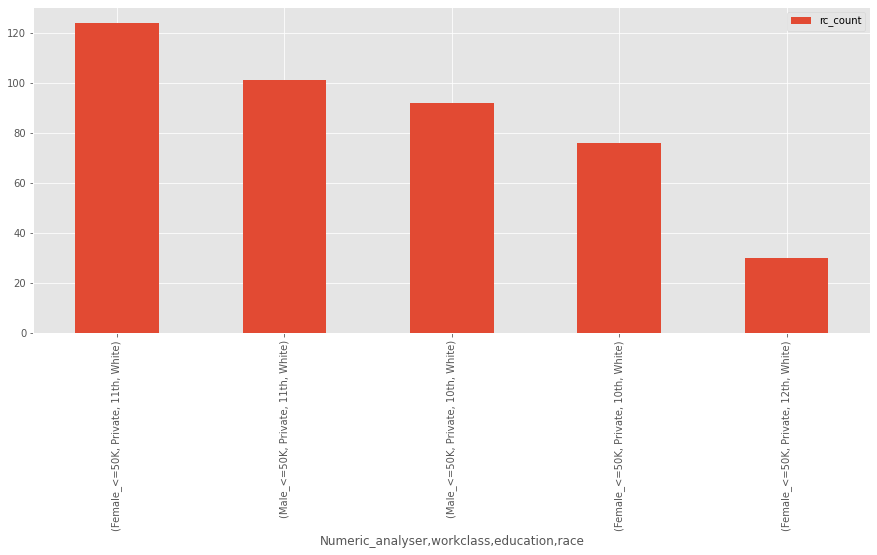

In [43]:
dfw=df[df["age"]<18].groupby(["Numeric_analyser","workclass","education","race"])[["race"]].count()
dfw.rename(columns={"race":"rc_count"},inplace=True)
dfw.sort_values("rc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

<FONT COLOR="GREEN"><B>THE REASON FOR FEMALES HERE BEING HIGH IS IN 11TH STD FEMALES ARE HIGH AND SO DOES WITH FILTER OF RACE AND EDUCATION COMBINED,FEMALES ABOOVE ARE HIGHER BUT OUT ASSUMPTION IS SECOND HIGHEST

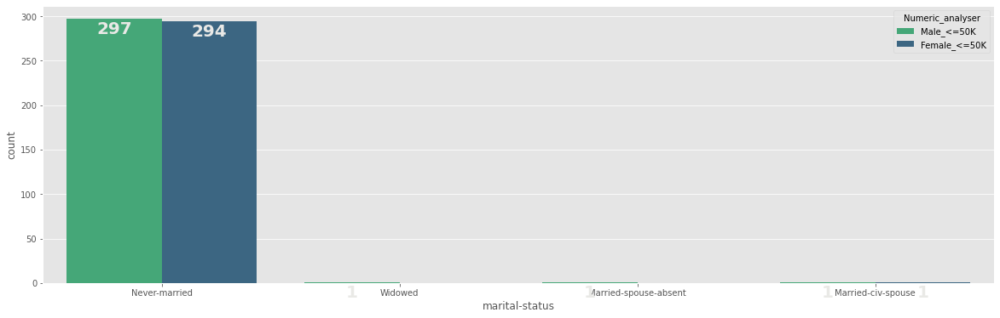

In [44]:
plt.figure(figsize=(20,6))
c="marital-status"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- Its Quite Obvious that we are analysing age less tha 18 so maximum people wont be married but there are some and since they are from USA(from analysis from all datapoints done before this aboove at start) anything can happen there and They seem to be different cases.But Looking here we observe that females and males are nearly equal in count
- As per aboove we assume that since 11th std has females high so here with marital status also we assume females from private 11th std completed from white race are high.

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status'>

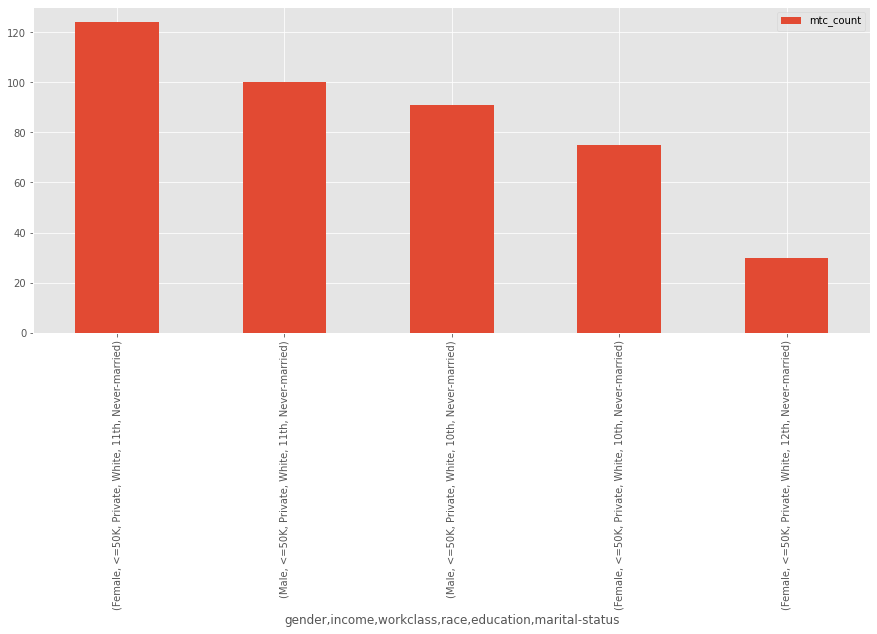

In [45]:
dfw=df[df["age"]<18].groupby(["gender","income","workclass","race","education","marital-status"])[["marital-status"]].count()
dfw.rename(columns={"marital-status":"mtc_count"},inplace=True)
dfw.sort_values("mtc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

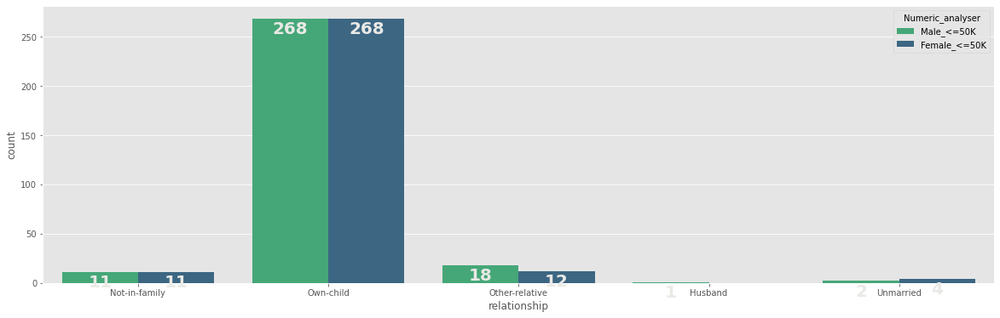

In [46]:
plt.figure(figsize=(20,6))
c="relationship"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- Most of The Males and females have equal count as usual and have own child of thier family as most of the males and females aint married,it looks like Females tend to live as single mothers and so does males as single fathers andd Since its USA anything can happen and not surprising too
- We Assume Females are the one child who have completed 11th std belonging from white race working in private sector with income<50K

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship'>

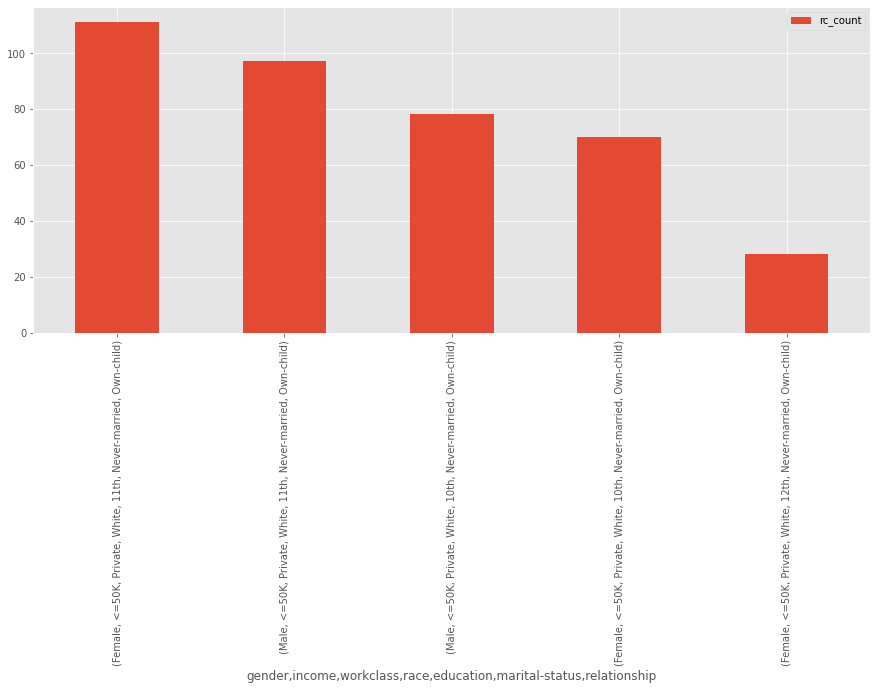

In [47]:
dfw=df[df["age"]<18].groupby(["gender","income","workclass","race","education","marital-status","relationship"])[["relationship"]].count()
dfw.rename(columns={"relationship":"rc_count"},inplace=True)
dfw.sort_values("rc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

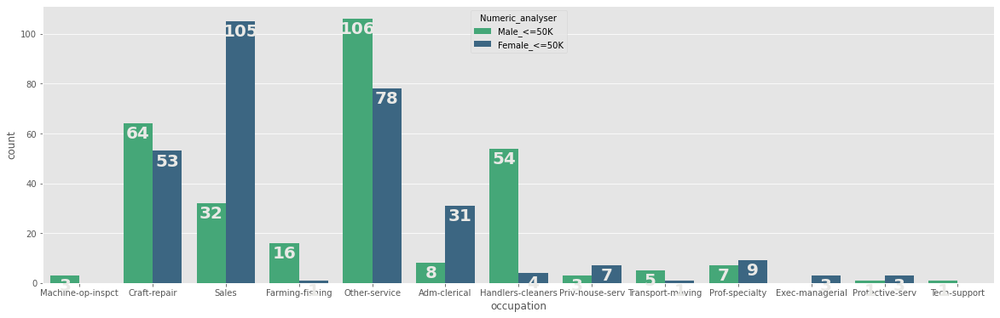

In [48]:
plt.figure(figsize=(20,6))
c="occupation"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- From Aboove we see that Females in Sales and Males In Other Services have nearly equal count.
- Since we have assumed that females are more with 11th std edu and even more than males we assume That 
    - Females with Sales Belonging to white race working in Sales belonging to private sector having own child but never married are more
    - Males With Other Services Belonging to white race working in Sales belonging to private sector having own child but never married are more
    - Or It Could be Vice Versa

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship,occupation'>

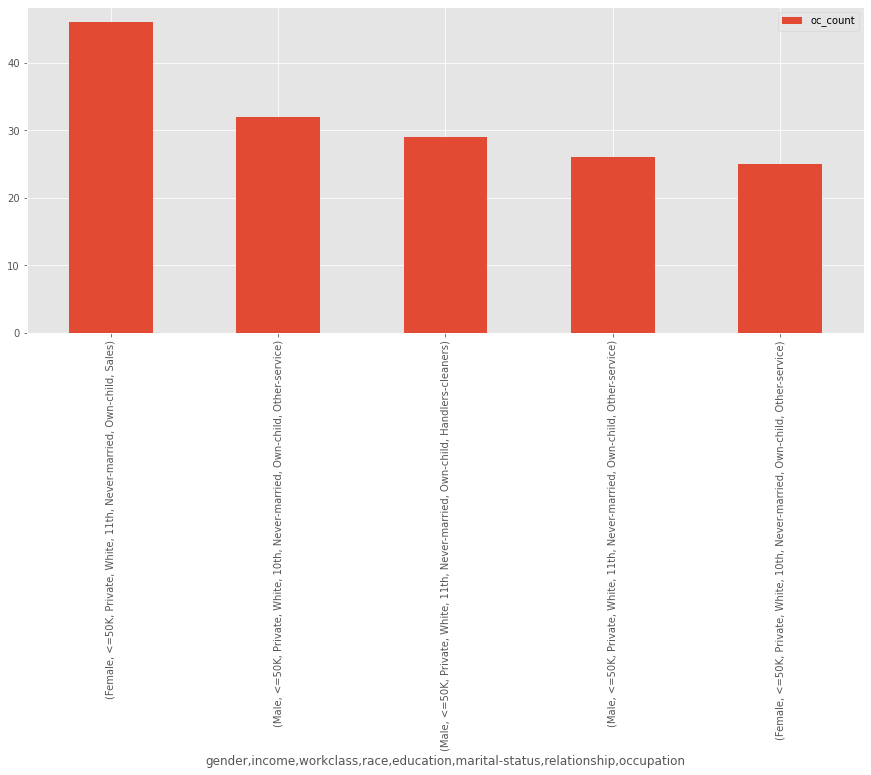

In [49]:
dfw=df[df["age"]<18].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation"])[["occupation"]].count()
dfw.rename(columns={"occupation":"oc_count"},inplace=True)
dfw.sort_values("oc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

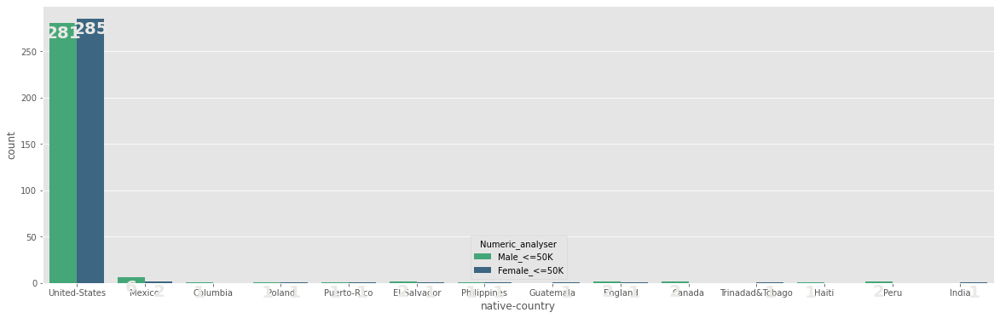

In [50]:
plt.figure(figsize=(20,6))
c="native-country"
ax=sns.countplot(x=c,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,c,ax)

As We See Most of Them are From USA and Straight conclude that Females with white race own child never married in sales are More.

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship,occupation,native-country'>

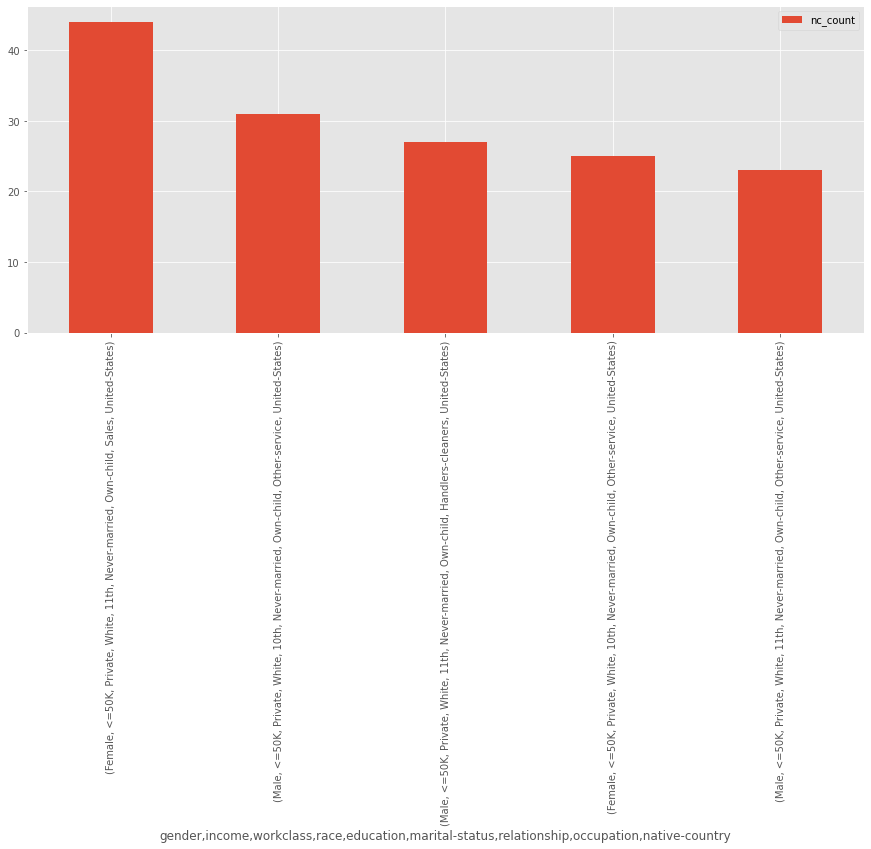

In [51]:
dfw=df[df["age"]<18].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw.head(5).plot(kind="bar",figsize=(15,6))

([<matplotlib.patches.Wedge at 0x25b057e8070>,
 [Text(0.6650590580684889, 0.8761828857499183, 'Female_<=50K_Private_White_11th_Never-married_Own-child_Sales_United-States'),
  Text(-0.8761828546162559, 0.6650590990855693, 'Male_<=50K_Private_White_10th_Never-married_Own-child_Other-service_United-States'),
  Text(-0.9287607599924328, -0.5894094083896854, 'Male_<=50K_Private_White_11th_Never-married_Own-child_Handlers-cleaners_United-States'),
  Text(0.09204559140357094, -1.0961421482194573, 'Female_<=50K_Private_White_10th_Never-married_Own-child_Other-service_United-States'),
  Text(0.9748239327009739, -0.5096256471503445, 'Male_<=50K_Private_White_11th_Never-married_Own-child_Other-service_United-States')],
 [Text(0.3627594862191757, 0.4779179376817736, '29.33%'),
  Text(-0.4779179206997759, 0.3627595085921287, '20.67%'),
  Text(-0.5065967781776906, -0.3214960409398283, '18.00%'),
  Text(0.0502066862201296, -0.5978957172106131, '16.67%'),
  Text(0.531722145109622, -0.2779776257183697

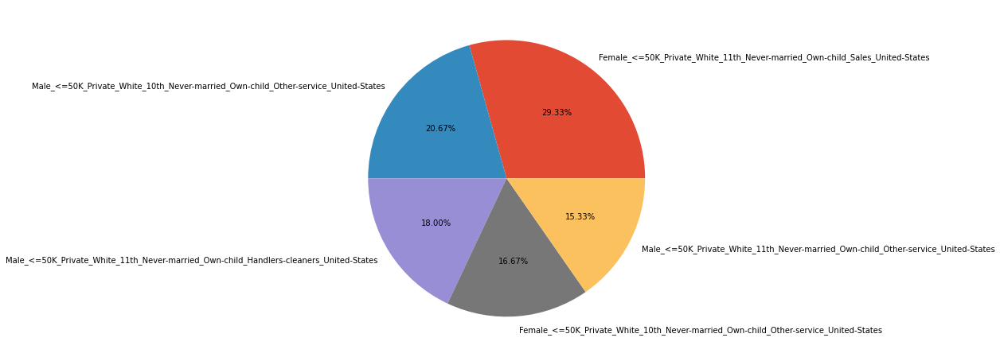

In [52]:
plt.figure(figsize=(10,8))
dfw=df[df["age"]<18].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

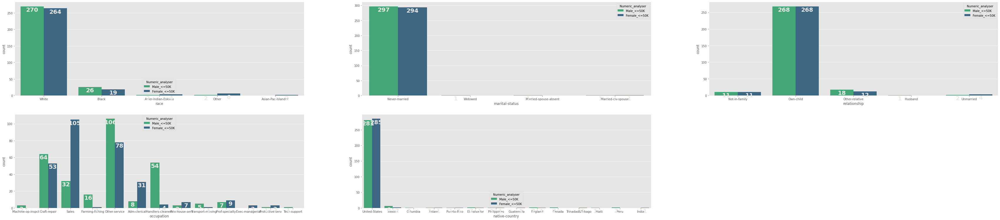

In [53]:
k=1
plt.figure(figsize=(60,20))
for i in ["race","marital-status","relationship","occupation","native-country"]:
    plt.subplot(eval("33"+str(k)))
    ax=sns.countplot(x=i,data=df[df["age"]<18],palette="viridis_r",hue="Numeric_analyser")
    getPlotLabels(df,c,ax)
    k=k+1

- So now we are done with the Numerical analysis using Categorical hue refernce and we know that the aboove category belong below 18,But below 18 also lets check what the mean age wrt gender and income.
- As we wanna see below what the age they start working or tend to start working as i know not many are there who work and some have not worked.
- Just out of curiousity lets also see Those who never worked whats thier age,is it below 18 or aboove or whatever.

<AxesSubplot:ylabel='Numeric_analyser'>

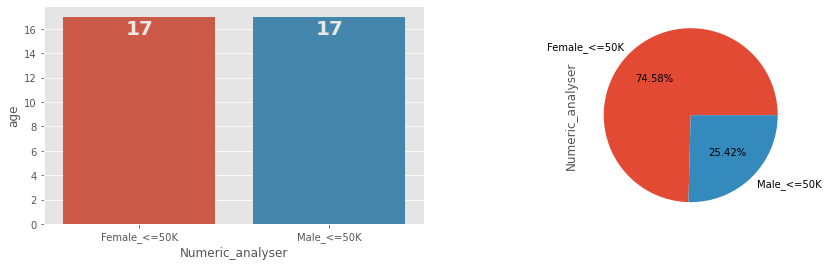

In [54]:
plt.figure(figsize=(15,4))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="age",data=df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],estimator=np.median)
getPlotLabels(df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],"Numeric_analyser",ax)
plt.subplot(122)
df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")]["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

From aboove we infer that Below 18,Only 17 yrs old start working due to some reasons and majority of them with around 75 % are Females

Since we now know Males and females do work and Females are More with aboove mentioned with green mixed text.Lets See What are the working Hours Of Those Females as well as Males because both are somewhat equal

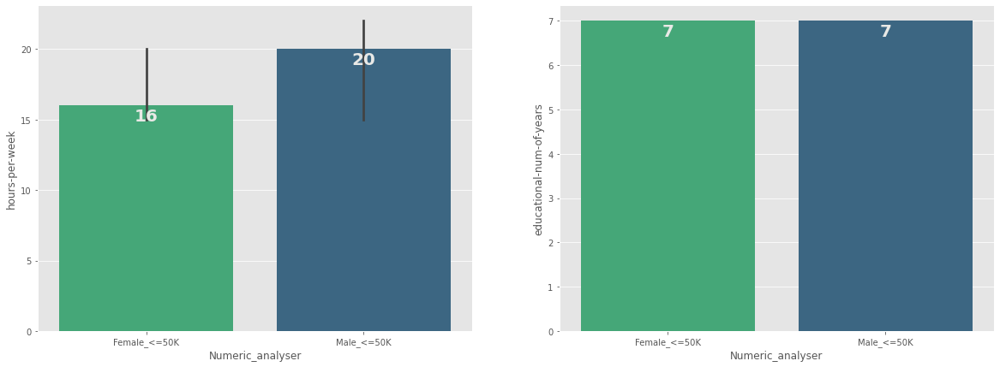

In [55]:
plt.figure(figsize=(20,7))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="hours-per-week",data=df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],palette="viridis_r",estimator=np.median)
getPlotLabels(df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],"Numeric_analyser",ax)
plt.subplot(122)
ax=sns.barplot(x="Numeric_analyser",y="educational-num-of-years",data=df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],palette="viridis_r",estimator=np.median)
getPlotLabels(df[(df["age"]<18) & (df["workclass"]=="Private") & (df["occupation"]=="Sales") & (df["marital-status"]=="Never-married") & (df["relationship"]=="Own-child") & (df["race"]=="White") & (df["education"]=="11th") & (df["native-country"]=="United-States")],"Numeric_analyser",ax)


From aboove we see that Females and Males are nearly equal but Males work more than females and both have studied for 7 yrs

Lets See HPW wrt Workclass and occuptaion

In [56]:
df[["workclass","Numeric_analyser","occupation"]][(df["Numeric_analyser"]=="Female_<=50K") & (df["occupation"]=="Protective-serv")].value_counts()

workclass    Numeric_analyser  occupation     
Local-gov    Female_<=50K      Protective-serv    45
Private      Female_<=50K      Protective-serv    41
State-gov    Female_<=50K      Protective-serv    18
Federal-gov  Female_<=50K      Protective-serv     3
dtype: int64

In [57]:
df[["native-country"]][(df["Numeric_analyser"]=="Female_<=50K") & (df["occupation"]=="Protective-serv")].value_counts()

native-country
United-States     103
Germany             2
Haiti               1
Cuba                1
dtype: int64

In [58]:
df[(df["workclass"]=="State-gov")&(df["Numeric_analyser"]=="Female_<=50K") & (df["occupation"].str.startswith("Protective"))][["hours-per-week"]].median()

hours-per-week    40.0
dtype: float64

Lets Look at HPW wrt to workclass and occupation below 18

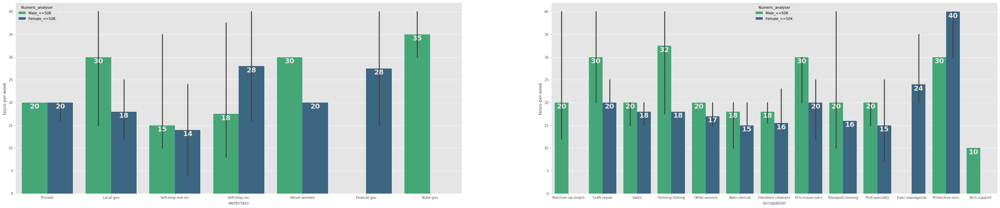

In [59]:
plt.figure(figsize=(50,10))
plt.subplot(121)
ax=sns.barplot(x="workclass",y="hours-per-week",data=df[df["age"]<18],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)
plt.subplot(122)
ax=sns.barplot(x="occupation",y="hours-per-week",data=df[df["age"]<18],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)

- From aboove we see Males In Govt agencies work min 30 HPW especially in State govt and Females In Federal goct and who are self employed work min 28 HPW but compared to Males they have low working Hours and They earn <50K.
- 16.8%(i.e 18/107 which is the value count of females <50K in state gov,look aboove two cells) Females (who are also highest count in occupation) with occupation as Protective-servant in state gov work 40 HPW and most of them are from USA. We Can do this type of analysis also but it would again take lot of time and lot of deep analytical efforts which i can do but no time and need to proceed,if u need you tpoo can find such type of insights and more better what u think like you can see count of females in fed gov of protective-ser or any oyher which hits ur mind).But this analysis is for this aboove graph only for other we will just quote what we see like we will only see HPW wrt to occupation only for other age ranges.


<li>
WE DID THIS SAME COUNT ANALYSIS BEFORE BUT THE DIFFERENCE IS WE SAW OVERALL COUNT OF PEOPLE AND FROM THAT WE INFERED THAT <br>
<ul><b><i>
MOST OF THE ADULTS OF AGE BETWEEN ARE <font color="green">MARRIED MALES</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">PRIVATE WORKCLASS</font> COMING FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font>AND BELONG TO <font color="red">36%</font> OF THE POPULATION AND ARE BETWEEN AGE RANGE OF <font color="green">28-48</FONT>
    </ul></b></i>
</li>
<li>
    BUT THIS TIME WE HAVE DONE THE SAME COUNT ANALYSIS ON AGE AND WE FOUND THAT <18
<br>
<ul><b><i>
    MOST OF THE ADULTS BELOW 18 HAVE NEARLY EQUAL FREQUENCY OF <FONT COLOR="GREEN">MALES AND FEMALES</FONT>AND ALL THE MALES AND FEMALES HAVE AGE OF 17 AND INCOME LESS THAN 50k BUT IN THIS AGE <18,MOST OF THEM ARE FEMALES OF AGE 17 WITH WORKCLASS AS <FONT COLOR="GREEN">PRIVATE</FONT> WORKING IN <FONT COLOR="GREEN">SALES</FONT> HAVING <FONT COLOR="GREEN">OWN CHILD</FONT> ONLY BUT <FONT COLOR="GREEN">NEVER MARRIED</FONT> AND FROM <FONT COLOR="GREEN">USA</FONT>AND BELONG TO <font color="red">29.33%</font> OF THE POPULATION.</I></B></UL>
    <ul><b><i>BUT HERE IN THIS CASE FEMALES HAVE HIGH WEIGHTAGE THAN MALES DUE TO MOST OF THEM COMPLETEING 11TH STD AND FEMALES BEING VERY HIGH IN EDUCATION FACTOR THAN MALES.ITS NOT THAT MALES ARE LESS BOTH FEMALES AND MALES OVERLAP IN SOME FACTORS FOR HIGH FREQUENCY COUNT AND ARE NEARLY EQUAL TO EACH OTHERS STATS
    </i></b></ul>
</li>


Lets Check The Age range Of people by excluding people below 18 and people of age aboove 65. i.e Young People.

<AxesSubplot:ylabel='Numeric_analyser'>

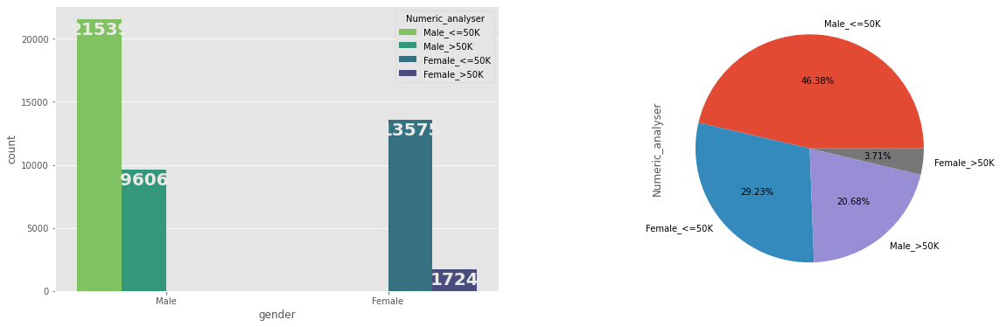

In [60]:
plt.figure(figsize=(20,6))
plt.subplot(121)
ax=sns.countplot(x="gender",data=df[(df["age"]>=18) & (df["age"]<=65)],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,"gender",ax)
plt.subplot(122)
df[(df["age"]>=18) & (df["age"]<=65)]["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

We Observe that in age range of 18 to 65, There are 46.38% of Males With Income <50K have High frequency. In aboove We Plot we saw One by one plot and extracted features. Here we will plot all the graphs at once and extract insights.

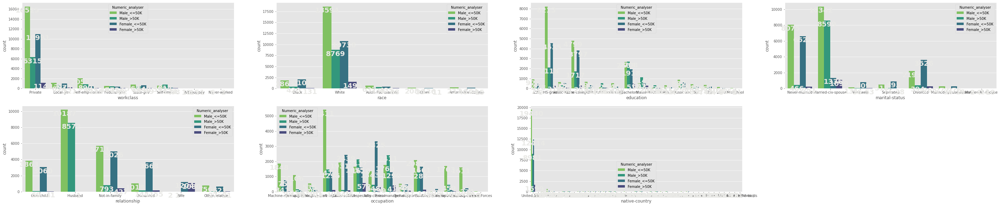

In [61]:
plt.figure(figsize=(50,10))
k=1
for i in ["workclass","race","education","marital-status","relationship","occupation","native-country"]:
    plt.subplot(int("24"+str(k)))
    ax=sns.countplot(x=i,data=df[(df["age"]>=18) & (df["age"]<=65)],palette="viridis_r",hue="Numeric_analyser")
    getPlotLabels(df,i,ax)
    k=k+1

- From Aboove we observe and Assume that Males With Income <50K Belonging to White race Working in Private Class as Crafts-Repairer with Education as High School Grad And Are Civi Spouse From United States Of Country are Top.
- This Is Obvious As We Saw That avg Age Of This Category is around 42 which we have seen before and 42 lies between 18-65,So Its Obvious and quite Understandable.
- Lets Compare

([<matplotlib.patches.Wedge at 0x25b03217ee0>,
 [Text(0.4989780531471739, 0.9803167357938231, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(-1.0532190831861392, 0.31737920979885953, 'Male_>50K_Private_White_Bachelors_Married-civ-spouse_Husband_Exec-managerial_United-States'),
  Text(-0.7065609287731784, -0.8430727453376629, 'Male_>50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(0.3116892340007551, -1.0549169737036288, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Machine-op-inspct_United-States'),
  Text(1.0097761851012683, -0.43629354338831267, 'Male_>50K_Private_White_Bachelors_Married-civ-spouse_Husband_Prof-specialty_United-States')],
 [Text(0.27216984717118575, 0.5347182195239034, '35.01%'),
  Text(-0.5744831362833486, 0.17311593261755973, '20.66%'),
  Text(-0.3853968702399155, -0.45985786109327054, '16.46%'),
  Text(0.1700123094549573, -0.5754092583837975, '14.89%'),
  Tex

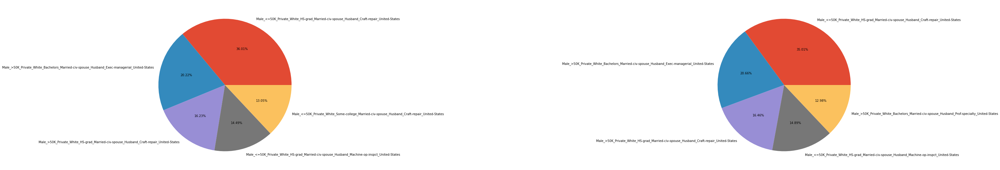

In [62]:
plt.figure(figsize=(60,10))
plt.subplot(121)
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))


plt.subplot(122)
dfw=df[(df["age"]>=18) & (df["age"]<=65)].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

- After Comparing We See that Compared To Pie of all the datapoint vs datapoints with age in range of 18-65 are overall same but looking over the difference of decimals,a litlle bit only
    - For First the difference is 1 i.e 36.01-35.01
    - For 2,3 and 4 the difference is between 0.1 and 0.5
    - For Last One There is a difference of 0.7 i.e 13.05-12.98
    - But The aboove differences are very very little and may or may not matter depending on use case but generally we ignore them and look overall differnces.
- But The Overall Conclusion is our assumption for This age range was correct and Both Graphs have no differnce if we round Off, And That May be Because 95% of data lies in This range so the little difference might be unknown changes in count and sum with people of age <18 and age>65(Which we will see Next after This analysis)



We Know that we are looking at age 18-65 but lets also see whats the precise age of males between 18-65 range and also the age of Males <50K income from private belong to white race and married as civ spouse from USA.

<AxesSubplot:ylabel='Numeric_analyser'>

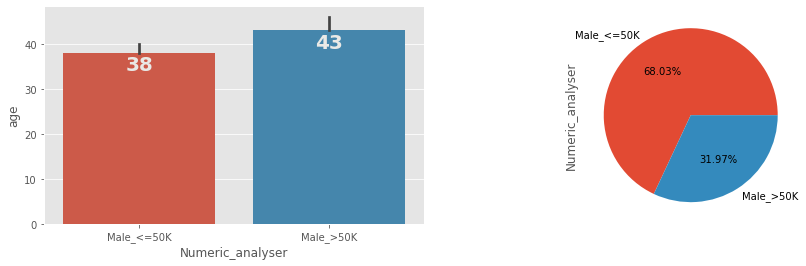

In [63]:
plt.figure(figsize=(15,4))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="age",data=df[((df["age"]>=18) & (df["age"]<=65)) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")],estimator=np.median)
getPlotLabels(df,"Numeric_analyser",ax)
plt.subplot(122)
df[((df["age"]>=18) & (df["age"]<=65)) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")]["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

We observe there are only males in age between 18-65 and now we observe that there are 68.03% of Males who are avg 38 yrs of age and rest have income aboove >50K and have age of avg 43 yrs.

Lets See Working Hours and Educatin period wrt gender and income for age between 18 and 65

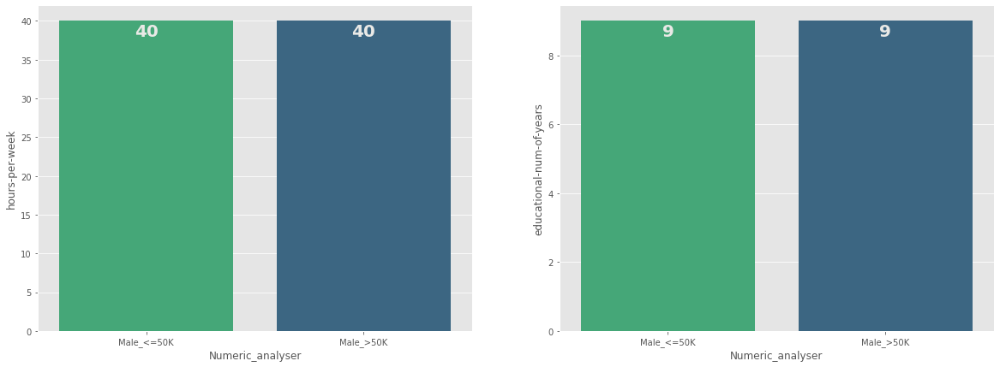

In [64]:
d=df[((df["age"]>=18) & (df["age"]<=65)) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")]
plt.figure(figsize=(20,7))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="hours-per-week",data=d,palette="viridis_r",estimator=np.median)
getPlotLabels(d,"Numeric_analyser",ax)
plt.subplot(122)
ax=sns.barplot(x="Numeric_analyser",y="educational-num-of-years",data=d,palette="viridis_r",estimator=np.median)
getPlotLabels(d,"Numeric_analyser",ax)

We Observe That Between Age of 18-65 only males are there to have Studied on avg for 9 yrs and Works 40 Hours per week

Lets Look at Hours Per Week wrt workclass and Occupation for age between 18 and 65

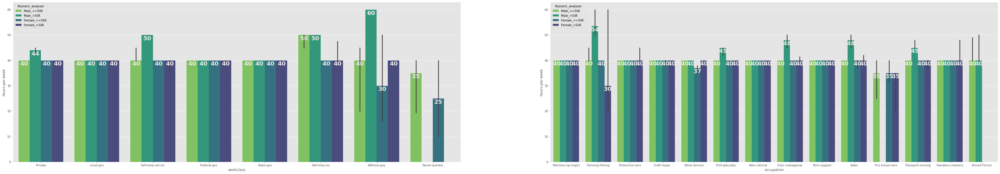

In [65]:
plt.figure(figsize=(60,10))
plt.subplot(121)
ax=sns.barplot(x="workclass",y="hours-per-week",data=df[((df["age"]>=18) & (df["age"]<=65))],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)
plt.subplot(122)
ax=sns.barplot(x="occupation",y="hours-per-week",data=df[((df["age"]>=18) & (df["age"]<=65))],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)

From Aboove We Observe That No Matter what the workclass Is Most of Males and females in age between 18-65 tend to work 40 HPW mostly but in Some Cases Males who are self employed tend to work more with avg of 50 HPW.

- <B>TILL NOW WE UNDERSTOOD THAT
    - <I>MOST OF THE ADULTS BELOW 18 HAVE NEARLY EQUAL FREQUENCY OF <FONT COLOR="GREEN">MALES AND FEMALES</FONT>AND ALL THE MALES AND FEMALES HAVE AGE OF 17 AND INCOME LESS THAN 50k BUT IN THIS AGE BELOW 18,MOST OF THEM ARE <FONT COLOR="GREEN">FEMALES</FONT> OF AGE <FONT COLOR="GREEN">17</FONT> WITH WORKCLASS AS <FONT COLOR="GREEN">PRIVATE</FONT> WORKING IN <FONT COLOR="GREEN">SALES</FONT> HAVING <FONT COLOR="GREEN">OWN CHILD</FONT> ONLY BUT <FONT COLOR="GREEN">NEVER MARRIED</FONT> AND FROM <FONT COLOR="GREEN">USA</FONT>AND BELONG TO <font color="red">29.33%</font> OF THE POPULATION.
    - FOR THE ADULTS IN AGE RANGE OF 18 TO 65,<font color="green">MARRIED MALES OF AVG AGE OF 38</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">IN PRIVATE WORKCLASS</font> COME FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font> AND THIS CATEGORY BELONG TO <font color="red">35%</font> OF POPULATION.
</I></B>

We Observed That there are people whose Age is aboove 65 and they also work,As below 18 is not a age of adult,same way age aboove 65 is considered as an age of retirement and still people work.Lets See Who has higher frequency.

<AxesSubplot:ylabel='Numeric_analyser'>

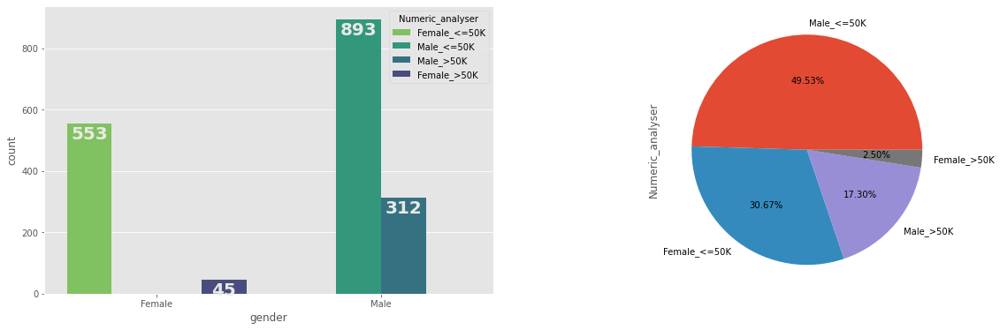

In [66]:
plt.figure(figsize=(20,6))
plt.subplot(121)
ax=sns.countplot(x="gender",data=df[df["age"]>65],palette="viridis_r",hue="Numeric_analyser")
getPlotLabels(df,"gender",ax)
plt.subplot(122)
df[(df["age"]>65)]["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

As usual,no difference in count. Males have higer frequency and income <50K even after the Age of 65 and are nealy around 50% of them if we round 49.53%.

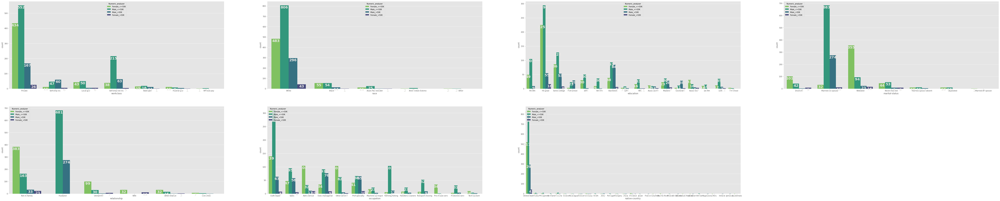

In [67]:
plt.figure(figsize=(100,20))
k=1
for i in ["workclass","race","education","marital-status","relationship","occupation","native-country"]:
    plt.subplot(int("24"+str(k)))
    ax=sns.countplot(x=i,data=df[(df["age"]>65)],palette="viridis_r",hue="Numeric_analyser")
    getPlotLabels(df,i,ax)
    k=k+1

Looking Aboove We See That The Conclusion and Assumption For Being Top is As Same as for People with age between 18 and 65 that

<AxesSubplot:xlabel='gender,income,workclass,race,education,marital-status,relationship,occupation,native-country'>

<Figure size 4320x720 with 0 Axes>

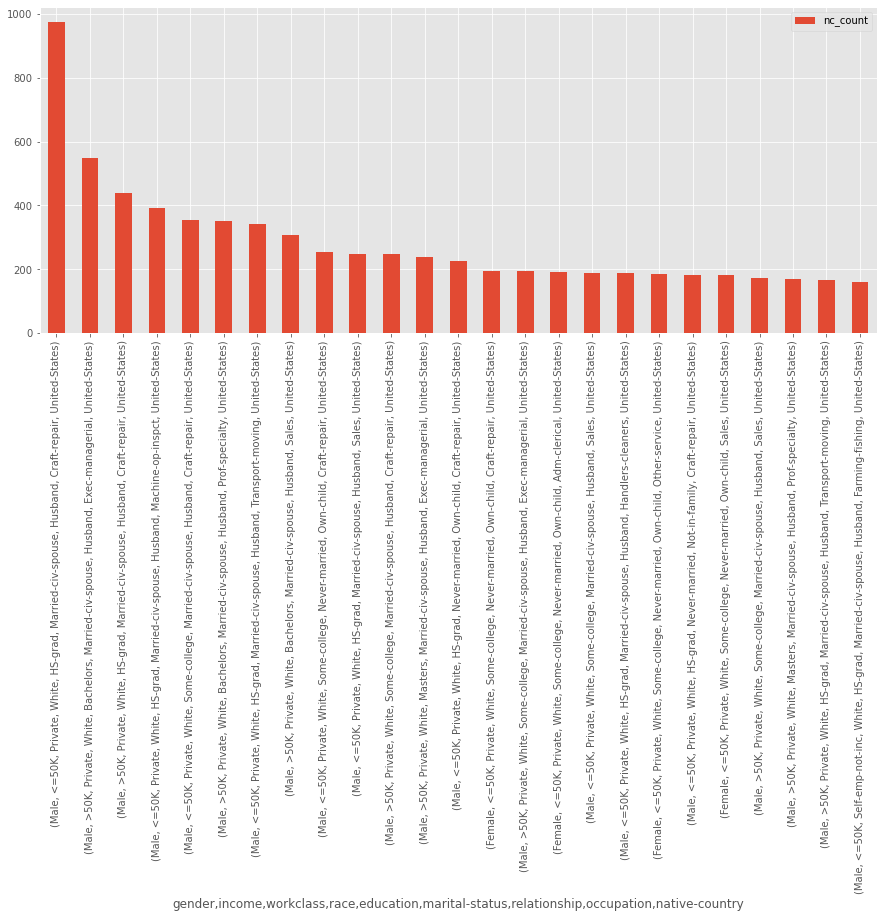

In [68]:
plt.figure(figsize=(60,10))
# plt.subplot(121)
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
# dfw=dfw.reset_index()
# dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
# plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))
dfw.head(25).plot(kind="bar",figsize=(15,6))

([<matplotlib.patches.Wedge at 0x25b0983d940>,
 [Text(0.5834629589773507, 0.9325078956777764, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(-0.9669316665478915, 0.5244455665051592, 'Male_<=50K_Self-emp-not-inc_White_HS-grad_Married-civ-spouse_Husband_Farming-fishing_United-States'),
  Text(-0.8213669061778616, -0.7316805350942501, 'Female_<=50K_Private_White_HS-grad_Widowed_Not-in-family_Craft-repair_United-States'),
  Text(0.26105938596749095, -1.0685728786555817, 'Male_<=50K_Private_White_Some-college_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(1.0016982497797564, -0.4545334051400106, 'Male_<=50K_Private_White_7th-8th_Married-civ-spouse_Husband_Craft-repair_United-States')],
 [Text(0.31825252307855484, 0.5086406703696962, '32.20%'),
  Text(-0.5274172726624862, 0.28606121809372315, '19.77%'),
  Text(-0.44801831246065177, -0.39909847368777274, '19.21%'),
  Text(0.14239602870954052, -0.5828579338121355, '15.25%'),
 

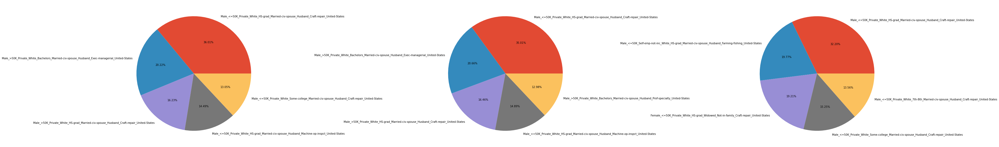

In [69]:
plt.figure(figsize=(60,10))
plt.subplot(131)
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))


plt.subplot(132)
dfw=df[(df["age"]>=18) & (df["age"]<=65)].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

plt.subplot(133)
dfw=df[(df["age"]>65)].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

- But The Overall Conclusion is our assumption for This age range was correct But The difference comapred to age<18 and age between 18 and 65 have some differences in some combos but the difference aint that big but not close enough too and that maybe because we are anlaysing age of greater extent so there might be less people in age >65
- But If We Combine age between 18 and 65 and age>65 we might see very close pie stat and the differences also might be very very less even less than age 18-65.Lets See

([<matplotlib.patches.Wedge at 0x25b071997f0>,
 [Text(0.4681260580534064, 0.9954185018229162, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(-1.0674453609185204, 0.2656320791123123, 'Male_>50K_Private_White_Bachelors_Married-civ-spouse_Husband_Exec-managerial_United-States'),
  Text(-0.6826951390967885, -0.8625122300892994, 'Male_>50K_Private_White_HS-grad_Married-civ-spouse_Husband_Craft-repair_United-States'),
  Text(0.3204207725263261, -1.0522977375883846, 'Male_<=50K_Private_White_HS-grad_Married-civ-spouse_Husband_Machine-op-inspct_United-States'),
  Text(1.0088438472038888, -0.43844508431371065, 'Male_<=50K_Private_White_Some-college_Married-civ-spouse_Husband_Craft-repair_United-States')],
 [Text(0.25534148621094893, 0.5429555464488633, '36.01%'),
  Text(-0.5822429241373747, 0.14489022497035214, '20.22%'),
  Text(-0.37237916678006644, -0.4704612164123451, '16.23%'),
  Text(0.17477496683254148, -0.5739805841391188, '14.49%'),
  T

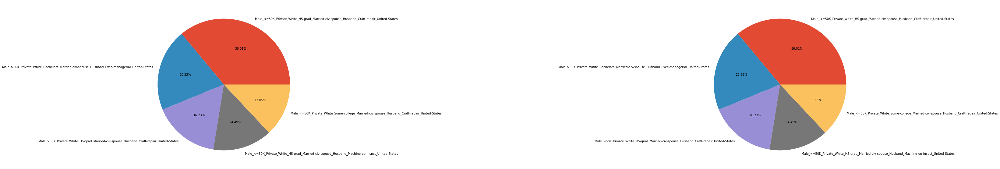

In [70]:
plt.figure(figsize=(60,10))
plt.subplot(121)
dfw=df.groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))


plt.subplot(122)
dfw=df[(df["age"]>=18)].groupby(["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"])[["native-country"]].count()
dfw.rename(columns={"native-country":"nc_count"},inplace=True)
dfw.sort_values("nc_count",inplace=True,ascending=False)
dfw=dfw.reset_index()
dfw["labels"]=["_".join(i) for i in dfw[["gender","income","workclass","race","education","marital-status","relationship","occupation","native-country"]].values]
plt.pie(dfw["nc_count"].head(5),autopct="%.2f%%",labels=dfw["labels"].head(5))

So Looking Aboove we Infer that The Stat we saw at first for all data point is totally same with stats of age>=18 and for age <18 the stats and combos differ as they are not adults by law of below 18.But it USA anything can happen

<AxesSubplot:ylabel='Numeric_analyser'>

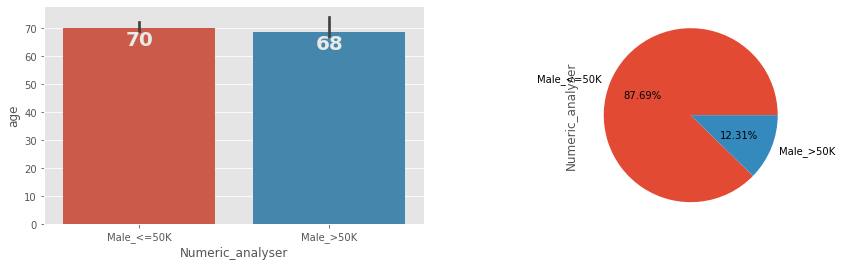

In [71]:
plt.figure(figsize=(15,4))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="age",data=df[((df["age"]>65)) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")],estimator=np.median)
getPlotLabels(d,"Numeric_analyser",ax)
plt.subplot(122)
df[((df["age"]>65)) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")]["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

Since We are analysing age more than 65,We have Seen That Males with income <50K are more But now we know that 87.69 % percent of Males have avg age of 70

Lets See Education Period and Working Hours wrt to gender and income

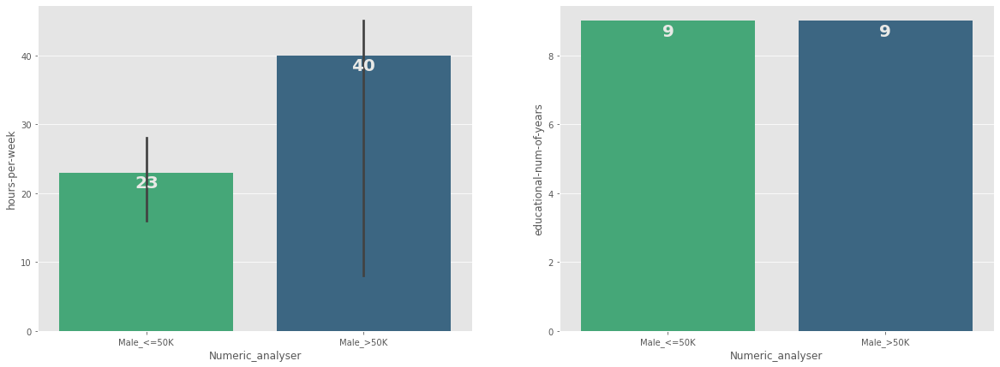

In [72]:
d=df[(df["age"]>65) & (df["workclass"]=="Private") & (df["occupation"]=="Craft-repair") & (df["marital-status"]=="Married-civ-spouse") & (df["relationship"]=="Husband") & (df["race"]=="White") & (df["education"]=="HS-grad") & (df["native-country"]=="United-States")]
plt.figure(figsize=(20,7))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="hours-per-week",data=d,palette="viridis_r",estimator=np.median)
getPlotLabels(d,"Numeric_analyser",ax)
plt.subplot(122)
ax=sns.barplot(x="Numeric_analyser",y="educational-num-of-years",data=d,palette="viridis_r",estimator=np.median)
getPlotLabels(d,"Numeric_analyser",ax)

Looking aboove we see that Aboove 65 There are only Males and The One Who Earn >50K,Work 40 HPW and The One who earn <50K Work 23 HPW and Have studied for avg 9 yrs

Lets Look at Hours Per Week wrt workclass and Occupation for age > 65

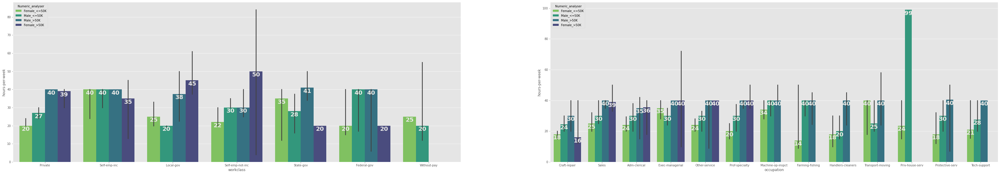

In [73]:
plt.figure(figsize=(60,10))
plt.subplot(121)
ax=sns.barplot(x="workclass",y="hours-per-week",data=df[(df["age"]>65)],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)
plt.subplot(122)
ax=sns.barplot(x="occupation",y="hours-per-week",data=df[(df["age"]>65)],estimator=np.median,hue="Numeric_analyser",palette="viridis_r")
getPlotLabels(df,"workclass",ax)

Males and Females aboove 65 overlap with different working hrs with most of them working between 20-40 HPW But In govt sectors Most of them having income >50K work more than 30HPW and in Occupation private servant works more.

- <B>TILL NOW WE UNDERSTOOD THAT
    - <I>MOST OF THE ADULTS BELOW 18 HAVE NEARLY EQUAL FREQUENCY OF <FONT COLOR="GREEN">MALES AND FEMALES</FONT>AND ALL THE MALES AND FEMALES HAVE INCOME LESS THAN 50k BUT IN THIS AGE LESS THAN 18,MOST OF THEM ARE FEMALES OF AVG AGE 17 WITH WORKCLASS AS <FONT COLOR="GREEN">PRIVATE</FONT> WORKING IN <FONT COLOR="GREEN">SALES</FONT> HAVING <FONT COLOR="GREEN">OWN CHILD</FONT> ONLY BUT <FONT COLOR="GREEN">NEVER MARRIED</FONT> AND FROM <FONT COLOR="GREEN">USA</FONT>AND BELONG TO <font color="red">29.33%</font> OF THE POPULATION.
    - FOR THE ADULTS IN AGE RANGE OF 18 TO 65,<font color="green">MARRIED MALES OF AVG AGE 38</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">IN PRIVATE WORKCLASS</font> COME FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font> AND THIS CATEGORY BELONG TO <font color="red">35%</font> OF POPULATION.
    - FOR THE ADULTS IN AGE ABOOVE 65,<font color="green">MARRIED MALES OF AVG AGE 70</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">IN PRIVATE WORKCLASS</font> COME FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font> AND THIS CATEGORY BELONG TO <font color="red">32.20%</font> OF POPULATION.
</I></B><BR><BR>

- <font size="5" color="gray"><b>NOTE:<br> THE PERCENTAGE STATS ARE WRT TO GROUPBY FACTORS AND ARE PERCENTAGE OF TOP 5 OR SAY HEAD(5) NOT THE WHOLE POPULATION PERECNTAGE WRT TO ORIGINAL DATASET. TO GET REAL PERECNTAGE USE THE THE ABOOVE CONCLUSION FILTER AND TAKE ITS SIZE AND DIVIDE BY SIZE OF ORIGINAL DATASET AND THATS THE REAL PERCENTAGE.</B></FONT>

<b><FONT COLOR="RED">FINAL EDA CONCLUSION</FONT>
- <font color="PURPLE" STYLE="FONT-FAMILY:PAPYRUS;">SO WE SAW THAT
    - <FONT COLOR="BLUE"><U><I>36%</I></U></FONT> OF <font color="green">MARRIED MALES</font> AS <font color="green">CIVIL SPOUSE</font> BELONGING TO <font color="green">WHITE</font> RACE HAVING A EDUCATION OR DEGREE OF <font color="green">HS-GRAD</font> WORKING IN THE FIELD OF <font color="green">CRAFTS AND REPAIR</font> IN THE <font color="green">IN PRIVATE WORKCLASS</font> COME FROM THE COUNTRY OF <font color="green">UNITED STATES OF AMERICA</font>ARE 18 AND ABOOVE.
    - <FONT COLOR="BLUE"><U><I>29.33%</I></U></FONT> ARE FEMALES WITH WORKCLASS AS <FONT COLOR="GREEN">PRIVATE</FONT> WORKING IN <FONT COLOR="GREEN">SALES</FONT> HAVING <FONT COLOR="GREEN">OWN CHILD</FONT> ONLY BUT <FONT COLOR="GREEN">NEVER MARRIED</FONT> AND FROM <FONT COLOR="GREEN">USA</FONT> AND ARE BELOW 18.
   

Now Lets Check the overall age range

<AxesSubplot:ylabel='Numeric_analyser'>

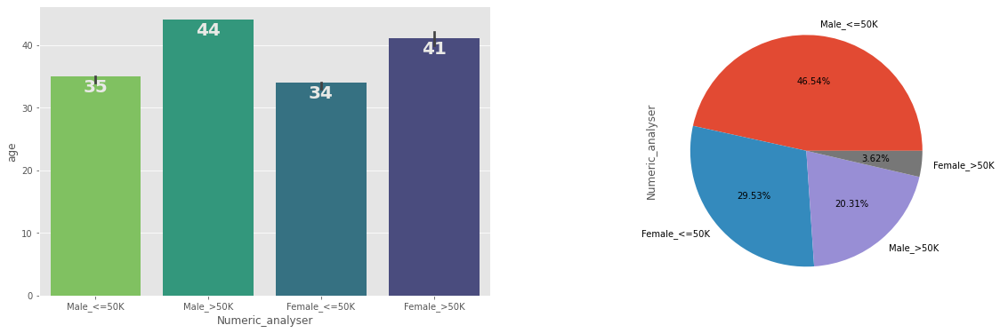

In [74]:
plt.figure(figsize=(20,6))
plt.subplot(121)
ax=sns.barplot(x="Numeric_analyser",y="age",data=df,palette="viridis_r",estimator=np.median)
getPlotLabels(df,"gender",ax)
plt.subplot(122)
df["Numeric_analyser"].value_counts().plot(kind="pie",autopct="%.2f%%")

We Observe that
- 46.54 % Males with income<50K have avg age of 35 and with income >50,20.31 % Males exceeds age 40 and has avg age od 44
- 29.53 % Females with income<50 have avg age of 34 and are near to men with income <50K and For Income >50K too 3.62 % of females are somewhat near to males aboove 40 and with avg age 41.

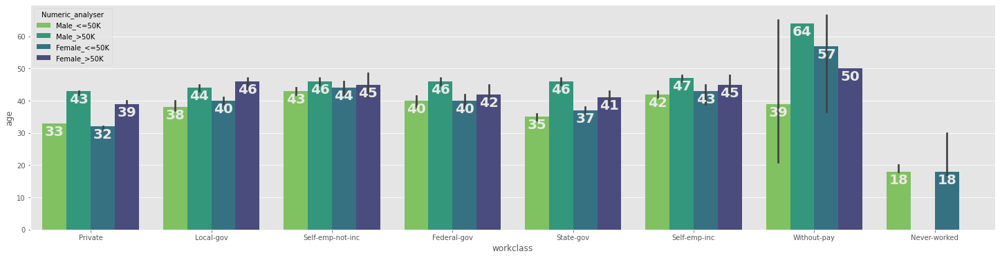

In [75]:
plt.figure(figsize=(25,6))
ax=sns.barplot(x="workclass",y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,"workclass",ax)

- So After Merging The work seems Little Easy and Now we can infer more precisely that Males with Income >50K have more Age compared to other sectors.
- If We Look at Gov Sectors There also Mostly males are max with they seem be in age of range 40 to 50. And we also see that Income is aboove 50 if the age is aboove or near 40 for Males.

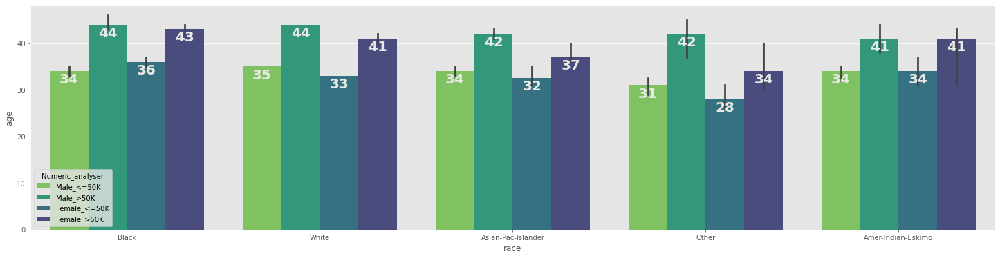

In [76]:
plt.figure(figsize=(25,6))
c="race"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- From aboove we See That males With Black and White race with income >50K have high frequency and Same goes for females but males are higher and Thhe median age of males and females in both races >40

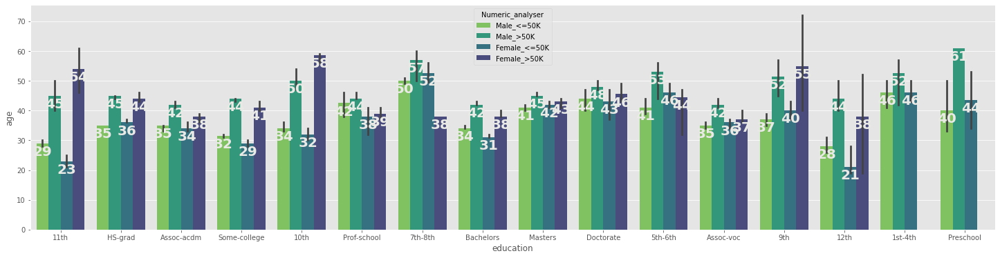

In [77]:
plt.figure(figsize=(25,6))
c="education"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

- From aboove We See That Max Age of 61 is of Males having Income >50K with Preschool as education.

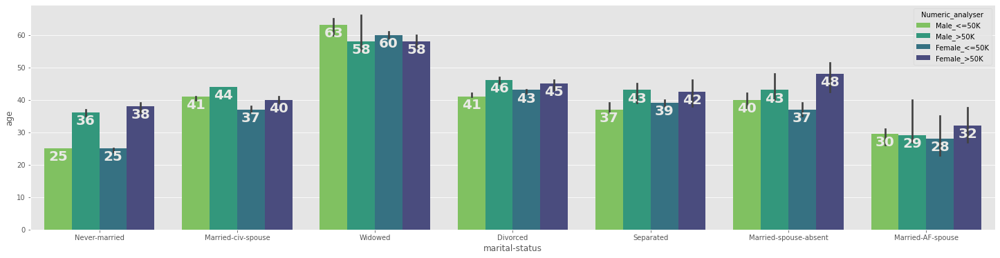

In [78]:
plt.figure(figsize=(25,6))
c="marital-status"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

From aboove we see that max Age is 63 of Males but they have income <50K and to look at income >50K we see that age is 58 in same marital status.

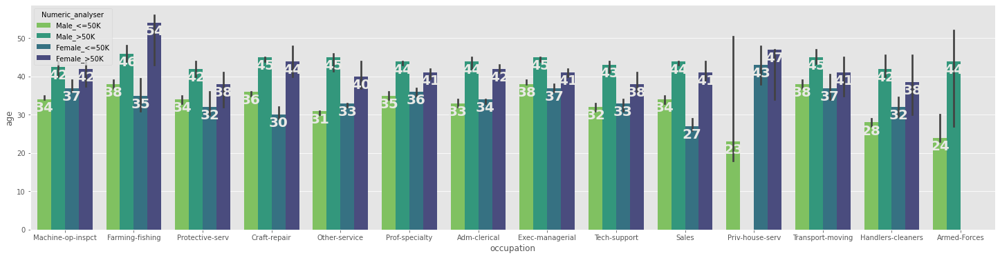

In [79]:
plt.figure(figsize=(25,6))
c="occupation"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

We See That For farm-fishing,Females having income >50K have max age and as >50K the age is also >40 and the age is 54. But Looking Over Males are still in range of 40 to 50 having income >50K.

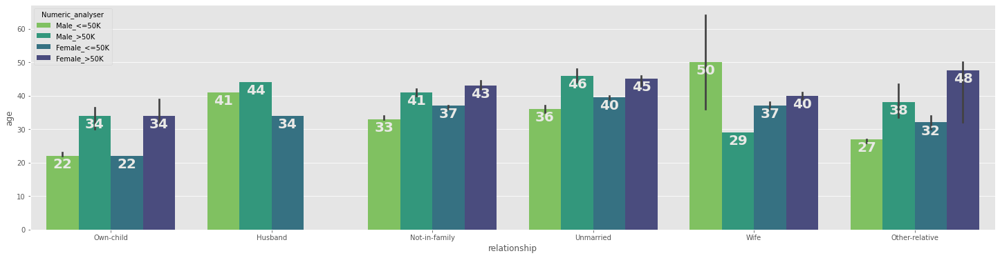

In [80]:
plt.figure(figsize=(25,6))
c="relationship"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

From aboove we see that Males have higher age in range of mostly 40 to 50, In some cases they have age <40 but all these males have income >50K. But looking over Females we see that those who have other rlatives have higher age of 48 and income is >50K.

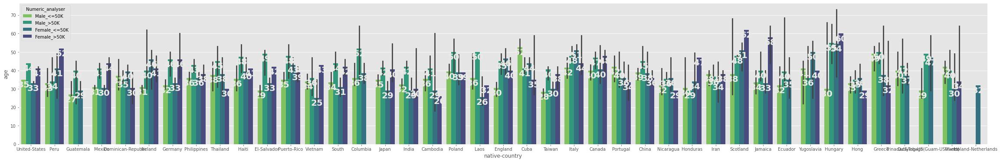

In [81]:
plt.figure(figsize=(40,6))
c="native-country"
ax=sns.barplot(x=c,y="age",data=df,palette="viridis_r",estimator=np.median,hue="Numeric_analyser")
getPlotLabels(df,c,ax)

From aboove We see that max age of 62 is from Scotland Of female having income>50K. and also males from scoland havig income >50K have max age of 48.

- So To conclude From Numerical Analysis, We State MAx to Min
    - For Income >50K
        - males have age between 40 to 60.
        - females have age between 35 to 68
    - For Income <=50K
        - Males are mostly between 20 to 40,In some little cases and columns the age ranges between 40 to 65(at max to take)
        - Females also are between 30 to 40,In some little cases and columns the age is below 30 and aboove 40 (i.e goes in range of 40 to 60 at min and can have aboove 60 also like >50k Males but only in some cases and cols this is observed)

<b><font color="red">
- THEN CHECK CORRELATION BETWEEN NUMERICS LIKE AND VERIFY VIA CORR TEST TO WHETHER COLUMNS IMPACT EACH OTHER OR NOT
    - EDUC NUM YEARS VS HPW
    - AGE VS HPW   
    - SO ON

So now we are done with numerical and categorical analysis, Lets Now Go ahead to check if relationships between numerical columns

<AxesSubplot:>

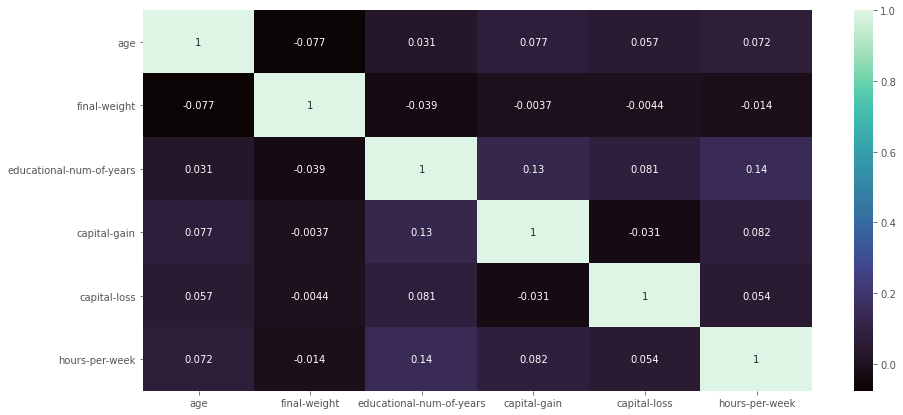

In [82]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(),annot=True,cmap="mako")

With the heatmap we understand that, There is weak relation between numerical columns.Lets See with pairplot also 

<Figure size 720x576 with 0 Axes>

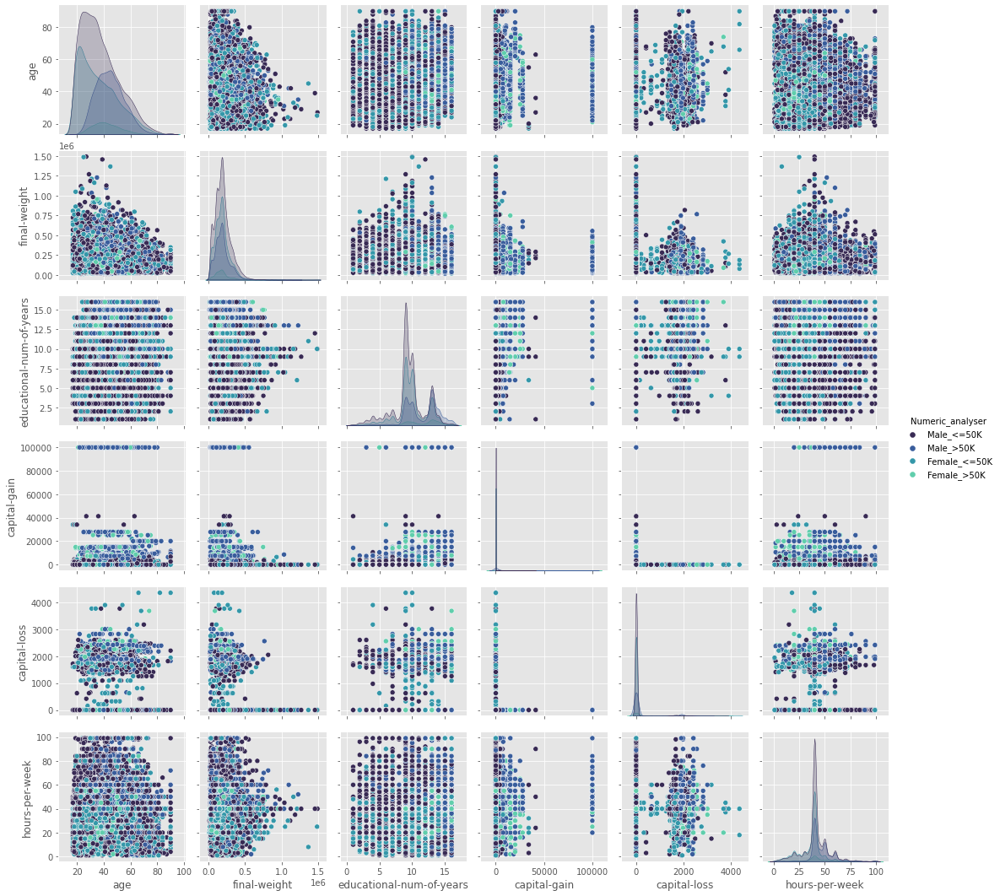

In [83]:
plt.figure(figsize=(10,8))
sns.pairplot(df,hue="Numeric_analyser",palette="mako")

So with Pairplot also we see that the points are scattered and look like weak relation. But our intent was to see see the relation between columns,Since this is a classification problem we wont care much about linear relationship much unless its a regression problem where we check Multi-collinearity.

- Now That we have seen relationship with correlation,we are sure that the columns have no relationship and this should be true via statistical tests when we perform pearsonr correlation test.
- Lets Test For
    - Age vs Educational No of years
    - Age Vs Working hours
    - Eductational Num of years vs work hours

- Our Hypothesis
    - $H_O$(Null Hypothesis)=There is No Relation Between columns.
    - $H_1$(Alternate Hypothesis)=There is relation between columns.

In [84]:
np.random.seed(1)
corrtestSample=df.sample(1000)
for i in ["educational-num-of-years","hours-per-week"]:
    test_1=sr(corrtestSample["age"],corrtestSample[i])
    if test_1[1]<0.05:
        print("There is correlation between the columns")
    else:
        print("No Correlation Between columns")
test_2=sr(corrtestSample["educational-num-of-years"],corrtestSample["hours-per-week"])
if test_2[1]<0.05:
    print("There is correlation between columns")
else:
    print("There is no correlation between columns")
print(test_1,test_2)

No Correlation Between columns
No Correlation Between columns
There is correlation between columns
SpearmanrResult(correlation=0.059726147386104274, pvalue=0.05902192028613973) SpearmanrResult(correlation=0.152170182853328, pvalue=1.3367955682210632e-06)


From aboove Test we see that There is no correlation between Age and educational-num-of-years and hours-per-week,But pvalue for working hours and educational num of years is low which says there is correlation.Lets see.

In [85]:
df[["educational-num-of-years","hours-per-week"]].corr()

,educational-num-of-years,hours-per-week
educational-num-of-years,1.000000,0.143689
hours-per-week,0.143689,1.000000


- From aboove we observe that There is correlation but its weak correlation which doesnt matter to us in this case.
- So we have compared relevant columns like Age,hours-per-week,educational no of years as Hours-per-week may depend on the age factor or hours per-week may depend on educational period and also somewhat there could be relation between age and edu num of years like more age more education period lol. But Here in this case there is no relation.
- Lets Proceed with categorical analysis and Check if there is any relation between categorical colums using chi sq test
- Our Hypothesis
    - $H_O$(Null Hypothesis)=There is No Relation Between columns.
    - $H_1$(Alternate Hypothesis)=There is relation between columns.

In [86]:
for i in ['workclass', 'education', 'marital-status', 'occupation','relationship', 'race', 'native-country',"gender"]:
    chicrosstab=pd.crosstab(corrtestSample["income"],corrtestSample[i])
    chitest=chi2_contingency(chicrosstab)
    if chitest[1]<0.05:
        print("There is Relation between Income and {}".format(i))

There is Relation between Income and workclass
There is Relation between Income and education
There is Relation between Income and marital-status
There is Relation between Income and occupation
There is Relation between Income and relationship
There is Relation between Income and race
There is Relation between Income and gender


From aboove we see that Education,Marital status,occupation,relationship and gender matter for income. We can understand that
- Education
- Occupation

These aboove factors do impact what a income should be i.e less or more and whatever but
- Marital-status
- relationship
- gender
- Race

Also impact income and from here we cannot surely state the reason.Maybe that Marital-status is being high profile then income maybe more,For Gender there might be males and females given perferances for income and same applies for race,relationship as i said gender impacts then maybe husband or wife may be earning more but we cant state this for sure and would need a complete sepearte analysis.


Lets Now Test A Hypothesis relted to Working Hours using ttest<br>
<i><font size=3 style="font-family:papyrus;">According to WHO(World Health Organization) To Keep Ourself fit and Fine and Be healthy,We should be working 7.5 Hrs On average.So Lets Test Whether The Avg working hours are 7.5 or Not.</font></i>

- Our Hypothesis
    - $H_O$(Null Hypothesis)$\Rightarrow\mu=56$
    - $H_1$(Alternate Hypothesis)$\Rightarrow\mu\neq56$

In [87]:
np.random.seed(1)
WorkHours=df.groupby("gender").sample(1000)

In [103]:
from scipy.stats import ttest_1samp,friedmanchisquare
hpwMale=ttest_1samp(WorkHours[WorkHours["gender"]=="Male"]["hours-per-week"],56)
hpwFemale=ttest_1samp(WorkHours[WorkHours["gender"]=="Female"]["hours-per-week"],56)
if hpwMale[1]<0.05:
    print("We reject the Null hypothesis and state that the avaerage Weekly working hours aint 56")
else:
    print("We reject the Null hypothesis the avaerage Weekly working hours aint 56")
if hpwMale[1]<0.05:
    print("We reject the Null hypothesis and state that the avaerage Weekly working hours aint 56")
else:
    print("We reject the Null hypothesis the avaerage Weekly working hours for females aint 56")
print(hpwMale[1],hpwFemale[1])

We reject the Null hypothesis and state that the avaerage Weekly working hours aint 56
We reject the Null hypothesis and state that the avaerage Weekly working hours aint 56
1.740762873073266e-164 2.2298533777996393e-286


From aboove we see That,With ttest We know That the avg working hours weekly aint 56 for Both males and Females. So with this we can say that the working hours are sure shit more than 56 as we have seen before and for surety lets plot thier avg weekly hours

In [104]:
WorkHours.groupby("gender")[["hours-per-week"]].mean()

,hours-per-week
gender,
Female,36.227
Male,42.698


So from aboove we see That the working hours are <56

<b>SO FAR OUR EDA IS DONE AND WE INFERED WHATEVER WE CAN AS PER OUR KNOWLEDGE.NOW LETS LOOK TO TREAT OUTLIERS OR MISSING VALUE AND TRAIN ML MODELS IN NEXT JUPYTER NOTEBOOK.</b>